In [1]:
%matplotlib inline
import sys
import pandas as pd
import math
import matplotlib.pylab as plt
import matplotlib as mpl
from collections import Counter
import numpy as np
import subprocess
import re
import itertools
import mmh3
import json
import pickle
from datetime import datetime as dt
from datetime import time
from random import randrange, gauss, shuffle, sample
import networkx as nx
import igraph
import cairo
import colorsys
import copy

In [3]:
def la_no_clu_2_la_no_col(layer_node_cluster, ncolors):
    """Return dictionary with structure layer:node:color, taking input-dictionary with structure layer:node:cluster
    """
    HSV_tuples = [(x*1.0/ncolors, 0.9, 0.9) for x in range(ncolors)]
    RGB_tuples = map(lambda x: colorsys.hsv_to_rgb(*x), HSV_tuples)
    RGB_tuples = sample(RGB_tuples, ncolors)
    
    layer_node_color = copy.deepcopy( layer_node_cluster )
    for layer in layer_node_color.iterkeys():
        for node,cluster in layer_node_color[layer].iteritems():
            layer_node_color[layer][node] = RGB_tuples[cluster-1]
    
    return layer_node_color, RGB_tuples


def igraph_layout(G, layoutname = 'fruchterman_reingold', gold_area = 1, cool = 1.5, directed = False):
    """Return graph layout in networkx position format taking a networkx.Graph object
    Update: Now also returns igraph.Graph object 
    """
    edgelist = [ (v1, v2, att['weight']) for v1,v2,att in G.edges(data=True) ]
    g = igraph.Graph.TupleList(edgelist, directed=directed, edge_attrs="weight")
    weightlist = g.es['weight']
    vertexlist = g.vs['name']
    nvertex = len(vertexlist)

    if layoutname == 'fruchterman_reingold':
        layout = g.layout_fruchterman_reingold(weights = g.es['weight'], area = gold_area*(nvertex)**2, coolexp=cool)
    if layoutname == 'kamada_kawai':
        layout = g.layout_kamada_kawai()
    if layoutname == 'lgl':
        layout = g.layout_lgl()
    if layoutname == 'mds':
        layout = g.layout_mds()
    if layoutname == 'reingold_tilford':
        layout = g.layout_reingold_tilford()
    if layoutname == 'reingold_tilford_circular':
        layout = g.layout_reingold_tilford_circular()
    if layoutname == 'graphopt':
        layout = g.layout_graphopt()
    if layoutname == 'drl':
        layout = g.layout_drl(weights = g.es['weight'] )
    
    pos=dict()
    for vertex, coords in zip(g.vs['name'], layout.coords):
        pos[vertex] = tuple(coords)
    
    return pos, g

## Infomap on facebook data for february 2014

In [48]:
multiplex_network_filename = "feb14_daily_tau_1day_normed12_intra_twostep0501_inter"#"feb14_daily_tau_1day"#_clamp1_intra_expdec_inter"
put=subprocess.check_output(['./Infomap/Infomap', 'netfiles/facebook/'+multiplex_network_filename+".net", 
                     'output/facebook', '-i multiplex', '--undirected', 
                     '--clu', '--expanded', '--two-level'])
print put

  Infomap v0.18.2 starts at [2016-04-08 14:32:08]
  -> Input network: netfiles/facebook/feb14_daily_tau_1day_normed12_intra_twostep0501_inter.net
  -> Output path:   output/facebook/
  -> Configuration: input-format = multiplex
                    overlapping
                    clu
                    expanded
                    two-level
                    undirected
  -> Use undirected flow and 2nd order Markov dynamics
Parsing multiplex network from file 'netfiles/facebook/feb14_daily_tau_1day_normed12_intra_twostep0501_inter.net'... done!
 --> Found 36552 multiplex links in 28 layers.
Generating memory network with multiplex relax rate 0.15... done!
Adding memory network from multiplex links... done!
  -> Found 738 nodes and 36552 memory links.
  -> Generated 5372 memory nodes and 36552 memory links.
Calculating global flow... 
  -> Using undirected links.
Calculating one-level codelength... done!
  -> One-level codelength: 11.98439641

Attempt 1/1 at [2016-04-08 14:32:08]
Initi

In [1212]:
def infomap_diagnostics(multiplex_network_filename):
    # run 2-level temporal infomap on mulitplex network
    subprocess.call(['./Infomap/Infomap', 'netfiles/facebook/'+multiplex_network_filename+".net", 
                         'output/facebook', '-i multiplex', '--undirected',
                         '--clu', '--expanded', '--two-level'])

    # load results of infomap, integer to hash-id dict and networkx networks
    with open('output/facebook/'+multiplex_network_filename+"_expanded.clu", 'r') as infile:
        multiplex_network_clusters = infile.read()
    with open('int2hash/facebook/'+multiplex_network_filename+'.pickle', 'r') as infile:
            intid_to_hashid = pickle.load(infile)

    # parse infomap results (extract dicts with results ordered in different ways)
    infomap_results = re.findall(r'\d+ \d+ \d+ \d\.\d+', multiplex_network_clusters)
    infomap_results = [ row.split() for row in infomap_results ]
    n_layers = max( [int(line[0]) for line in infomap_results] )
    n_clusters = max( [int(line[2]) for line in infomap_results] )

    allcluster_node = {}
    layer_cluster_node = {layer: {} for layer in range(1,n_layers+1) }
    layer_node_cluster = {layer: {} for layer in range(1,n_layers+1) }

    for layer, node, cluster, _ in infomap_results:
        try:
            allcluster_node[ int(cluster) ].add( intid_to_hashid[ int(node) ] )
        except KeyError:
            allcluster_node[ int(cluster) ] = { intid_to_hashid[ int(node) ] }

        try:
            layer_cluster_node[ int(layer) ][ int(cluster) ].add( intid_to_hashid[ int(node) ] )
        except KeyError:
            layer_cluster_node[ int(layer) ][ int(cluster) ] = { intid_to_hashid[ int(node) ] }

        layer_node_cluster[ int(layer) ][ intid_to_hashid[ int(node) ] ] = ( int(cluster) )

    AKTIV = {}
    lifetimes = []
    groupsizes = []
    for layer in layer_cluster_node.keys():
        layer_clusters = layer_cluster_node[layer].keys()
        # remove no longer active clusters
        for active_cluster in AKTIV.keys():
            if active_cluster not in layer_clusters:
                lifetimes.append( AKTIV[active_cluster] )
                del AKTIV[active_cluster]
        for cluster in layer_clusters:
            # add 1 to cluster lifetime if it is already an active cluster
            if cluster in AKTIV.keys():
                AKTIV[cluster] += 1
            # add cluster to the active ones giving it lifetime 1
            elif cluster not in AKTIV.keys():
                AKTIV[cluster] = 1
            # record groupsize of each cluster
            groupsizes.append( len(layer_cluster_node[layer][cluster]) )
            
        # add lifetime of remaining active clusters
        for l_time in AKTIV.values():
            lifetimes.append(l_time)


    return( np.mean(lifetimes), np.std(lifetimes), len(allcluster_node.keys()), np.mean(groupsizes), np.std(groupsizes) , layer_node_cluster, layer_cluster_node, allcluster_node, infomap_results, n_clusters)

In [1213]:
muwhats = [0] + np.arange(0.05,10.15,0.1).tolist()
results = []
for muwhat in muwhats:
    meanlife,standardlife,ngroups,meansize,standardsize,_,_,_,_,_ = infomap_diagnostics('feb14_daily_intra_normal_inter_twostep_{}muwhat'.format(muwhat) )
    results.append( [meanlife,standardlife, ngroups, meansize,standardsize] )

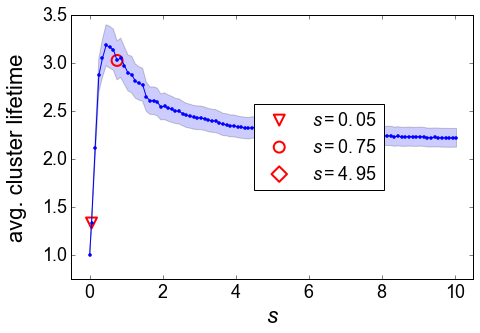

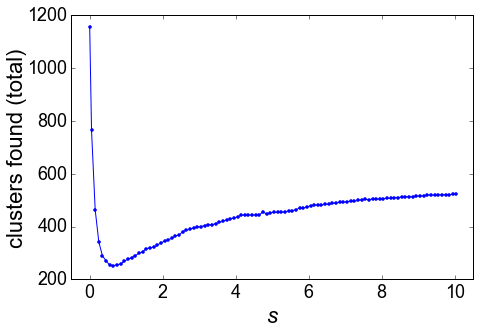

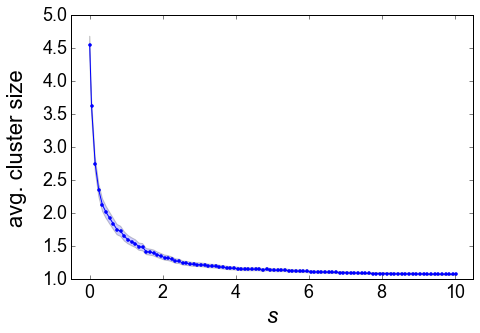

In [1247]:
from matplotlib import rcParams

rcParams['font.family'] = 'Arial'#'Bitstream Vera Serif'
rcParams.update({'font.size': 18})

rcParams['mathtext.fontset'] = 'custom'
rcParams['mathtext.rm'] = 'Arial'
rcParams['mathtext.it'] = 'Arial:italic'
rcParams['mathtext.bf'] = 'Arial:bold'

ml=[meanlife for meanlife,standardlife, ngroups, meansize,standardsize in results]
stdl=[standardlife/np.sqrt(ngroups) for meanlife,standardlife, ngroups, meansize,standardsize in results]
ng=[ngroups for meanlife,standardlife, ngroups, meansize,standardsize in results]
ms=[meansize for meanlife,standardlife, ngroups, meansize,standardsize in results]
stds=[standardsize/np.sqrt(ngroups) for meanlife,standardlife, ngroups, meansize,standardsize in results]

pppp=[1,8,50]

fig=plt.figure(figsize=(7,5))
ax=fig.add_subplot(111)
ax.set_xlim(-0.5,10.5)
ax.set_ylim(0.75,3.5)
ax.plot( muwhats, ml, '.-')
ax.fill_between(muwhats, np.array(ml)-np.array(stdl), np.array(ml)+np.array(stdl),
                alpha=0.2, facecolor='blue')
ax.scatter( muwhats[pppp[0]], ml[pppp[0]],marker = 'v', s=120, facecolors='none', color = 'red', lw=2, label='$s={}$'.format(muwhats[pppp[0]]))
ax.scatter( muwhats[pppp[1]], ml[pppp[1]],marker = 'o', s=120, facecolors='none', color = 'red', lw=2, label='$s={}$'.format(muwhats[pppp[1]]))
ax.scatter( muwhats[pppp[2]], ml[pppp[2]],marker = 'D', s=120, facecolors='none', color = 'red', lw=2, label='$s={}$'.format(muwhats[pppp[2]]))
ax.set_xlabel('$s$',fontsize=22)
ax.set_ylabel('avg. cluster lifetime', fontsize=22)
ax.xaxis.set_label_coords(0.5,-0.1)
ax.yaxis.set_label_coords(-0.11,0.5)
ax.legend(scatterpoints=1, loc='upper right', bbox_to_anchor=(0.8, 0.7), fontsize=18)
plt.tight_layout()
plt.savefig('figures/clustermetrics/facebook/LIFETIME_feb14.pdf_err', bbox_inches='tight', format='pdf')

fig=plt.figure(figsize=(7,5))
ax=fig.add_subplot(111)
ax.set_xlim(-0.5,10.5)
ax.plot( muwhats, ng , '.-')
ax.set_xlabel('$s$',fontsize=22)
ax.set_ylabel('clusters found (total)', fontsize=22)
ax.xaxis.set_label_coords(0.5,-0.1)
ax.yaxis.set_label_coords(-0.11,0.5)
plt.tight_layout()
plt.savefig('figures/clustermetrics/facebook/NCLUSTERS_feb14.pdf', bbox_inches='tight', format='pdf')

fig=plt.figure(figsize=(7,5))
ax=fig.add_subplot(111)
ax.set_xlim(-0.5,10.5)
ax.plot( muwhats, ms , '.-')
ax.fill_between(muwhats, np.array(ms)-np.array(stds), np.array(ms)+np.array(stds),
                alpha=0.2, facecolor='blue')
ax.set_xlabel('$s$',fontsize=22)
ax.set_ylabel('avg. cluster size', fontsize=22)
ax.xaxis.set_label_coords(0.5,-0.1)

ax.yaxis.set_label_coords(-0.11,0.5)
plt.tight_layout()
plt.savefig('figures/clustermetrics/facebook/CLUSTERSIZE_feb14_err.pdf', bbox_inches='tight', format='pdf')

In [1039]:
with open('pickle_uniplex/facebook/feb14_daily.pickle', 'r') as infile:
        face_feb14_daily = pickle.load(infile)

with open('pickle_uniplex/facebook/feb14.pickle', 'r') as infile:
        face_feb14 = pickle.load(infile)
        
G = face_feb14_daily[ day - 1 ]           
pos,_ = igraph_layout(G,gold_area=100)

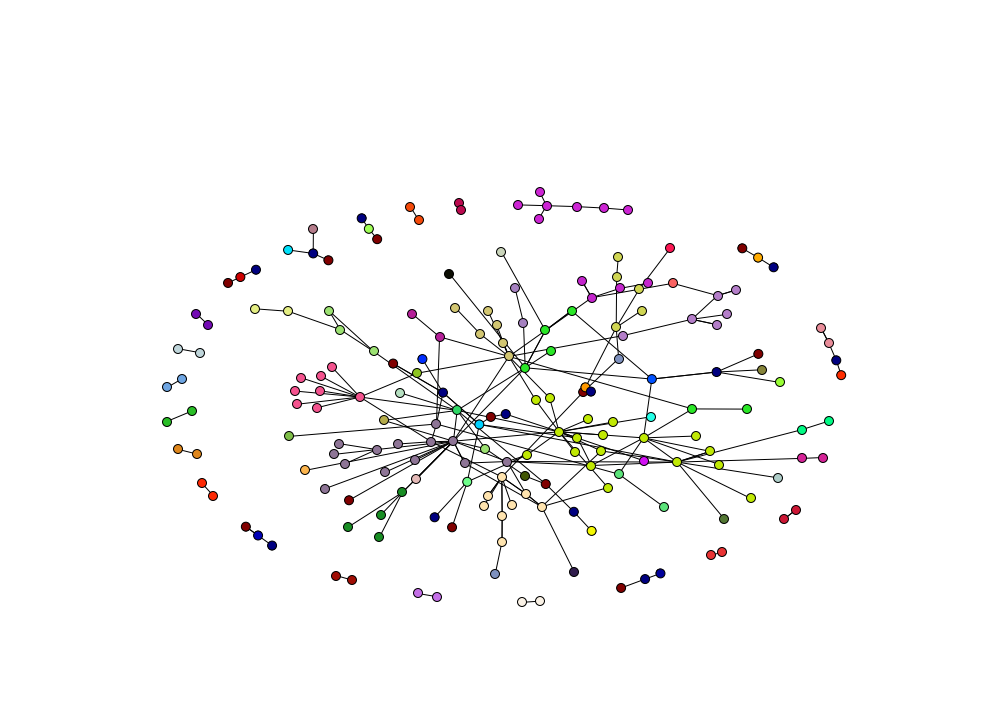

In [1042]:
plt.figure(figsize=[16,12])
day = 2 # OBS: list of uniplex networks layers is 0-indexed and the multiplex layer names are 1-indexed

#pos = nx.nx_agraph.graphviz_layout(G,prog='neato')
#pos,_ = igraph_layout(G,gold_area=100)

plt.axis('off')
nx.draw_networkx(G, with_labels=False, pos = pos, node_size = 60, arrows=0)

for cluster, nodeset in la_clu_no_fb[ day ].items():
    nx.draw_networkx_nodes(G, with_labels=False, pos = pos, nodelist=list(nodeset),
                           node_color=np.random.rand(3), node_size = 80)
    
#plt.savefig("figures/infomaptest_wednesday.pdf", format="pdf")

In [887]:
muwhat = 0.05
meanlife_fb, nclus_fb, meangs_fb, la_no_clu_fb, la_clu_no_fb, \
allcluster_node_fb, infomap_results_fb, n_clu_fb = infomap_diagnostics('feb14_daily_intra_normal_inter_twostep_{}muwhat'.format(muwhat) )

In [888]:
superlist=[]
for clu in allcluster_node_fb.values():
    superlist += list(clu)

co = Counter(superlist)
sorted( list( co.itervalues() ), reverse=True )[0:10]

[26, 25, 21, 21, 21, 21, 20, 20, 20, 19]

In [889]:
bff_list = []
bff_set = set()
for uberclu in clu_saus.keys():
    friend1 = partiprofiler1(uberclu).most_common()[0][0]
    friend2 = partiprofiler1(uberclu).most_common()[1][0]
    bff_set = bff_set | {friend1, friend2}
    
    counter = 0
    for fb_cluster in allcluster_node_fb.values():
        if friend1 in fb_cluster and friend2 in fb_cluster:
            counter+=1
    bff_list.append(counter)

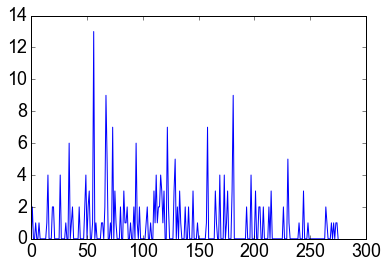

In [890]:
plt.plot(bff_list)

In [891]:
from itertools import combinations
combo = combinations(list(bff_set),2)
all_combos = list(combo)
np.random.shuffle(all_combos)
hey=all_combos[0:300]
somelist=[]

for i in range(300):
    friend1 = hey[i][0]
    friend2 = hey[i][1]
    
    counter = 0
    for fb_cluster in allcluster_node_fb.values():
        if friend1 in fb_cluster and friend2 in fb_cluster:
            counter+=1
    somelist.append(counter)

(0, 13)

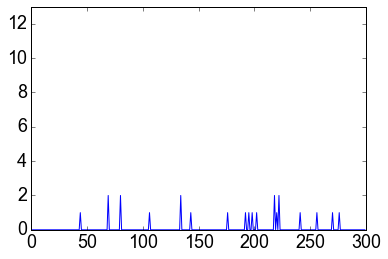

In [892]:
plt.plot(somelist)
plt.ylim(0,max(bff_list))

In [885]:
print  '    random pairs: ', np.mean(somelist) , '    core pairs: ' , np.mean(bff_list)

    random pairs:  0.02     core pairs:  0.188405797101


# Build d3 dataset for facebook

In [4]:
# -------------------------------- #
## Compute community similarities ##
# -------------------------------- #

def get_similarity(i,j,communities, count=False):
    """communities : Communities in each layer"""
    sim_counter = len(communities[i] & communities[j])
    tot_counter = len(communities[i] | communities[j])
    
    if count:
        return sim_counter / float(tot_counter), sim_counter
    else:
        return sim_counter / float(tot_counter)

def compute_similarity_matrix(communities):
    dim = len(communities)
    X = {}
    for i in range(dim):
        for j in range(dim):
            sim, count = get_similarity(i+1,j+1,communities, count=True)
            try:
                X['c'+str(i+1)].update({'c'+str(j+1): {'sim': sim, 'count': count}})
            except KeyError:
                X['c'+str(i+1)] = {'c'+str(j+1): {'sim': sim, 'count': count}}

    return X

In [78]:
muwhat=4.95
multiplex_network_filename = 'feb14_daily_intra_normal_inter_twostep_{}muwhat'.format(muwhat)
_,_,_,layer_node_cluster, layer_cluster_node, allcluster_node, infomap_results, n_clusters\
                                        = infomap_diagnostics(multiplex_network_filename)
    
## ------------------------ ##
## Define LAYERS to analyse ##
## ------------------------ ##

layer_filename = '../Data/processed_data/binned_networks/facebook/feb14_daily.pickle'
with open(layer_filename, 'r') as infile:
        layers = pickle.load(infile)
        
## ------------------- ##
## Compute COMMUNITIES ##
## ------------------- ##

similarities = compute_similarity_matrix(allcluster_node)

In [79]:
#Canvas parameters
actual_width = len( set([node for nodelist in allcluster_node.values() for node in nodelist]) )
actual_height = len( layer_cluster_node.items() )
min_group_size = 0

In [80]:
def is_valid_location(new_block, existing_blocks):
    """Check whether random horizontal location for block is unoccupied"""
    pad = 5
    nb_x = new_block['x']
    nb_w = new_block['w']
    nb_range = set(range(int(nb_x-pad),int(nb_x+nb_w+pad)))
    for block in existing_blocks:
        eb_x = block['x']
        eb_w = block['w']
        eb_range = set(range(int(eb_x-pad),int(eb_x+eb_w+pad)))
        if len(nb_range & eb_range) != 0:
            return False

    return True

# Set working width and height
width = actual_width*5
height = actual_height

#------#
# Time #
#------#

# Start, termination, timestep variables
t0 = str(dt.fromtimestamp(layers[0]['timestamp'].values[0])) # 2014-02-01 00:01:07
tt = str(dt.fromtimestamp(layers[-1]['timestamp'].values[-1])) # 2014-02-28 23:52:52
d_t = str((layers[1]['timestamp'].values[0]-layers[0]['timestamp'].values[0])/60) 

thickness = layers[1]['timestamp'].values[0] - \
            layers[0]['timestamp'].values[0] # 300 (seconds)

# Lines marking important points in time
grid_times = [time(h) for h in [8,12,13,17]]
grid_ticks = dict((i+1,str(dt.fromtimestamp(l['timestamp'].values[-1]))) 
                   for i, l in enumerate(layers) 
                   if dt.fromtimestamp(l['timestamp'].values[-1]).time() in grid_times)

# Time tick labels
#label_times = [time(h) for h in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]]
#label_ticks = dict((i+1,str(dt.fromtimestamp(l['timestamp'].values[-1]))) 
#                  for i, l in enumerate(layers) 
#                  if dt.fromtimestamp(l['timestamp'].values[-1]).time() in label_times) # for 24 hr bluetooth data
label_ticks = {k:k for k in  range(1,29)} # for 1-day facebook data

#----------------------#
# Build data structure #
#----------------------#

# Initiate data structure
ds = {
    'meta': {'w': width, 'h': height},
    'time': {'t0': t0,
             'tt': tt,
             'dt': d_t,
             'ticks': {'label_ticks': label_ticks,
                       'grid_ticks': grid_ticks}
            },
    'sims': similarities,
    'coms': {},
    'layer_networks': {}
}

# Compute geometry and location of community blocks
preferred_locations = {}
prev_layer_blocks = {}
for l,coms in layer_cluster_node.items():
    # Community-size pairs
    com_size_pairs = [(k, len(v)) for k,v in coms.items() if len(v) >= min_group_size]
    
    # Compute blocks also in previous layer (CONTINUING BLOCKS)
    this_layer_blocks = {}
    not_in_prev = []
    for c,s in com_size_pairs:
        
        com = "c"+str(c)
        if com in prev_layer_blocks:
            prev_block = prev_layer_blocks[com]
            this_x = (prev_block['w']-s)/2.0+prev_block['x'] # center new block immediately below prev
            block = {'x':this_x, 'w': s}
            this_layer_blocks[com] = block
            
            points = [[this_x,l-1], [this_x+s,l-1], [this_x,l], [this_x+s,l]]
            for p in points:
                ds['coms'][com]['blocks'][-1]['points'].insert(
                    len(ds['coms'][com]['blocks'][-1]['points'])/2, p
                )
                
                ds['coms'][com]['tt'] = layers[l-1]['timestamp'].values[-1]
                
                ds['coms'][com]['duration'] = \
                    ds['coms'][com]['tt'] - \
                    ds['coms'][com]['t0']
                
                ds['coms'][com]['avg_size'] += s
                ds['coms'][com]['avg_size'] /= 2.0
                if s > ds['coms'][com]['max_size']: # update max size, should the current width be larger
                    ds['coms'][com]['max_size'] = s
                elif s < ds['coms'][com]['min_size']: # update min size, should the current width be smaller
                    ds['coms'][com]['min_size'] = s
        else:
            not_in_prev.append((c,s))

    # Compute blocks not in previous layer (NEW BLOCKS)
    existing_blocks = this_layer_blocks.values()
    for c, s in not_in_prev:
        com = "c"+str(c)
        
        # First try to put the block at its preferred location
        if com in preferred_locations:
            
            this_x = preferred_locations[com]-s/2.0
            block = {'x': this_x, 'w': s}
            
            if is_valid_location(block, existing_blocks):
                
                this_layer_blocks[com] = block
                existing_blocks = this_layer_blocks.values()
                
                points = [[this_x,l-1], [this_x+s,l-1], [this_x,l], [this_x+s,l]]
                for i, p in enumerate(points):
                    if com not in ds['coms']:
                        ds['coms'][com] = {'blocks': [], 
                                           't0': layers[l-1]['timestamp'].values[0], 
                                           'tt': layers[l-1]['timestamp'].values[-1],
                                           'duration': thickness,
                                           'abs_size': len(allcluster_node[c]),
                                           'min_size': s,
                                           'max_size': s,
                                           'avg_size': s}
                    if i == 0:
                        ds['coms'][com]['blocks'].append({'points': [p], 'c': com})
                    else:
                        ds['coms'][com]['blocks'][-1]['points'].insert(
                            len(ds['coms'][com]['blocks'][-1]['points'])/2, p
                        )
                        ds['coms'][com]['avg_size'] += s
                        ds['coms'][com]['avg_size'] /= 2.0
                        if s > ds['coms'][com]['max_size']:
                            ds['coms'][com]['max_size'] = s
                        elif s < ds['coms'][com]['min_size']:
                            ds['coms'][com]['min_size'] = s
                
                # SUCCES! Continue to next community
                continue
                
        # If that fails, go ahead and place the block wherever it fits!
        counter = 0
        while True:
            counter += 1
            
            if counter > 100000:
                print "Can't place block anywhere"
                print l
                sys.exit()
                
            this_x = randrange(0,width-s)
            block = {'x':this_x, 'w': s}
            if is_valid_location(block, existing_blocks):
                this_layer_blocks[com] = block
                existing_blocks = this_layer_blocks.values()
                
                points = [[this_x,l-1], [this_x+s,l-1], [this_x,l], [this_x+s,l]]
                for i, p in enumerate(points):
                    if com not in ds['coms']:
                        ds['coms'][com] = {'blocks': [], 
                                           't0': layers[l-1]['timestamp'].values[0], 
                                           'tt': layers[l-1]['timestamp'].values[-1],
                                           'duration': thickness,
                                           'abs_size': len(allcluster_node[c]),
                                           'min_size': s,
                                           'max_size': s,
                                           'avg_size': s}
                    if i == 0:
                        ds['coms'][com]['blocks'].append({'points': [p], 'c': com})
                    else:
                        ds['coms'][com]['blocks'][-1]['points'].insert(
                            len(ds['coms'][com]['blocks'][-1]['points'])/2, p
                        )
                        ds['coms'][com]['avg_size'] += s
                        ds['coms'][com]['avg_size'] /= 2.0
                        if s > ds['coms'][com]['max_size']:
                            ds['coms'][com]['max_size'] = s
                        elif s < ds['coms'][com]['min_size']:
                            ds['coms'][com]['min_size'] = s
                break
            
        preferred_locations[com] = block['x']+block['w']/2.0
        
        
    prev_layer_blocks = this_layer_blocks
    
# Add colors
# Deprecated: is still needed on script. Misleading that it is not namechanged or something.
com_cols = {}
for com in ds['coms'].keys():
    r = np.average([mmh3.hash(n)%256 for n in allcluster_node[int(com[1:])]])
    g = np.average([mmh3.hash(n)%255 for n in allcluster_node[int(com[1:])]])
    b = np.average([mmh3.hash(n)%254 for n in allcluster_node[int(com[1:])]])

    #ds['coms'][com]['color'] = 'rgb(%d,%d,%d)' % (r,g,b)
    com_cols[com] = 'rgb(%d,%d,%d)' % (r,g,b)
    
# Add networks
def layer_networks(filename, layer_cluster_node):
    
    with open(filename, 'r') as infile:
        rawstring = infile.read()
    
    rawstring_nodes, rawstring_edges = rawstring.split("#")[:-1]
    
    nodes_map = dict((int(re.findall(r'\d+', n)[0]), re.findall(r'[0-9a-f]{30}', n)[0]) for n in 
                      re.findall(r'\d+ "Node [0-9a-f]{30}" \d\.\d', rawstring_nodes))
    nodes_map_reverse = dict((v,k) for k,v in nodes_map.items())

    ln = {'data': {}}
    
    e_li = [e_str.split() for e_str in rawstring_edges.split('\n')[1:]] # [['1', '347', '1', '348', '1'],...]

    # Add edges, one at a time
    for e in e_li:
        #layer, source, target, value = int(e[0]), int(e[1]), int(e[3]), int(e[4])
        layer, source, target, value = int(e[0]), int(e[1]), int(e[3]), float(e[4])
        try:
            group_source = [g for g,n in layer_cluster_node[layer].items() if nodes_map[source] in n][0]
            group_target = [g for g,n in layer_cluster_node[layer].items() if nodes_map[target] in n][0]
        except IndexError:
            # This occurs if the source/target has no group, WHICH IT SHOULD. Why this happend (and it
            # very rarely does) I don't know, maybe it's something with Infomap.
            print "node", source, "or", target, "has no group in layer", layer, "... skipping link!"
            continue
            
        if "c"+str(group_source) not in com_cols or "c"+str(group_target) not in com_cols:
            continue
    
        edge = {'source': source, 'target': target, 'value': value/10.0}
        try:
            ln['data'][layer]['links'].append(edge)
        except KeyError:
            ln['data'][layer] = {'links': [edge]}
        
        for n1, n2 in [(source, target),(target, source)]:
            try:
                ln['data'][layer]['links_dict'][n1].append(n2)
            except KeyError:
                try:
                    ln['data'][layer]['links_dict'][n1] = [n2]
                except KeyError:
                    ln['data'][layer]['links_dict'] = {n1: [n2]}
                
            
    # Add nodes
    for layer, edges_and_nodes in ln['data'].items():
        edges = edges_and_nodes['links']
        nodes_names = set()
        for e in edges:
            nodes_names.add(e['source'])
            nodes_names.add(e['target'])
        nodes = []
        for nn in nodes_names:
            group = [g for g,n in layer_cluster_node[layer].items()
                         if nodes_map[nn] in n][0]
            try:
                col = com_cols['c'+str(group)]
            except KeyError:
                #col = 'rgb(%d,%d,%d)' % (200,200,200)
                continue
            node = {'name': nn, 'id': nodes_map[nn], 'group': group}
            try:
                ln['data'][layer]['nodes'][nn] = node
            except KeyError:
                ln['data'][layer].update({'nodes': {nn: node}})
                
            try:
                ln['data'][layer]['groups'][group].append(node['name'])
            except KeyError:
                try:
                    ln['data'][layer]['groups'][group] = [node['name']]
                except KeyError:
                    ln['data'][layer]['groups'] = {group: [node['name']]}
    
    return ln

layer_networks = layer_networks('netfiles/facebook/'+multiplex_network_filename+'.net', layer_cluster_node)
ds['layer_networks'] = layer_networks

In [81]:
## -------------------------------- ##
## Store D3-loadable data structure ##
## -------------------------------- ##

with open('d3data/facebook_feb_4p95.json', 'w') as outfile:
    json.dump(ds,outfile)

# Project ninjaplots

In [109]:
with open('pickle_uniplex/facebook/feb14.pickle', 'r') as infile:
        face_feb14 = pickle.load(infile)

G=face_feb14[0]
gaf = igraph.Graph()
gaf.add_vertices( G.nodes() )

In [208]:
# add edges between nodes in a cluster for all clusters
for cluster, c_nodes in allcluster_node.iteritems():
    cluster_edeligst = list( itertools.combinations(c_nodes,2) )
    gaf.add_edges( cluster_edeligst )

In [338]:
visual_style={}
vertexlist = gaf.vs['name']
nvertex = len(vertexlist)
visual_style["bbox"] = (600,500)
outdegree = gaf.outdegree()
visual_style["vertex_size"] = 7#[x/max(outdegree)*10+7 for x in outdegree]
visual_style["margin"] = 10
master_layout = gaf.layout_fruchterman_reingold(area=100000*(nvertex)**2,coolexp=1.5)
#master_layout = gaf.layout_graphopt(node_charge=18.51, spring_constant=8000)#,spring_length=1)
visual_style["layout"] = master_layout
visual_style["edge_color"] = '100,100,100,0.5'
visual_style["vertex_color"] = "grey" 
igraph.plot(gaf, **visual_style)

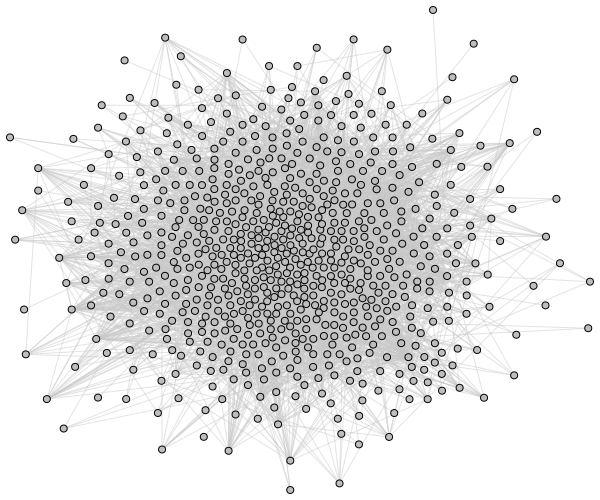

In [402]:
with open('pickle_uniplex/facebook/feb14.pickle', 'r') as infile:
        face_feb14 = pickle.load(infile)

_,gg = igraph_layout(face_feb14[0], directed=True)

gg.to_undirected(mode="collapse", combine_edges=sum) #for plotting purposes
layer_node_color = la_no_clu_2_la_no_col( layer_node_cluster=layer_node_cluster, ncolors=n_clusters )
#master_layout = gg.layout_fruchterman_reingold(weights = gg.es['weight'], area=100000*(nvertex)**2,coolexp=1.5, maxiter=1000)
master_layout = gaf.layout_graphopt(node_charge=1.5, spring_constant=1000, niter=500)

visual_style={}
vertexlist = gg.vs['name']
nvertex = len(vertexlist)
visual_style["bbox"] = (600,500)
outdegree = gg.outdegree()
visual_style["vertex_size"] = 7#[x/max(outdegree)*10+7 for x in outdegree]
visual_style["margin"] = 10
visual_style["layout"] = master_layout
visual_style["vertex_color"] = "grey" 
visual_style["edge_color"] = '200,200,200,0.5'
igraph.plot(gg, **visual_style)

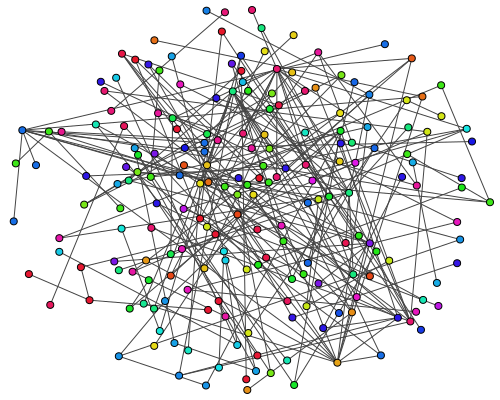

In [342]:
day=3
_,gg = igraph_layout(face_feb14_daily[day-1], directed=True)
gg.to_undirected(mode="collapse", combine_edges=sum) #for plotting purposes

visual_style={}
vertexlist = gg.vs['name']
nvertex = len(vertexlist)
visual_style["bbox"] = (500,400)
outdegree = gg.outdegree()
visual_style["vertex_size"] = 7#[x/max(outdegree)*10+7 for x in outdegree]
visual_style["margin"] = 10
visual_style["layout"] = master_layout#gg.layout_fruchterman_reingold(weights = gg.es['weight'], area=10*(nvertex)**2,coolexp=1.50) #master_layout
visual_style["vertex_color"] = [layer_node_color[day][name] for name in gg.vs['name'] ]
#visual_style["edge_arrow_size"] = 1.101
igraph.plot(gg, **visual_style)

In [209]:
#number of occurences of group links
import collections
gaflist=gaf.get_edgelist()
grouplinks = [(item,count) for item, count in collections.Counter(gaflist).items() if count > 1]
grouplinks[120:140]

[((481, 675), 3),
 ((143, 641), 2),
 ((35, 677), 2),
 ((117, 481), 3),
 ((203, 265), 2),
 ((19, 577), 2),
 ((681, 695), 2),
 ((40, 329), 2),
 ((158, 196), 2),
 ((223, 486), 2),
 ((371, 512), 2),
 ((130, 442), 2),
 ((138, 626), 3),
 ((339, 616), 2),
 ((117, 675), 2),
 ((153, 526), 2),
 ((145, 402), 3),
 ((196, 650), 2),
 ((116, 417), 2),
 ((153, 217), 2)]

# egoplots

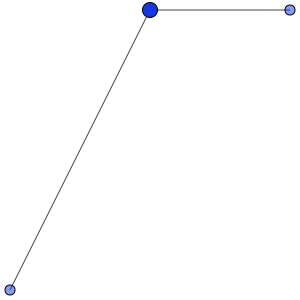

In [1067]:
day=2
egonode = '8b32905dca5af2cb0f45055108a274'
egocluster = la_no_clu_fb[day][egonode]
layer_node_color,_ = la_no_clu_2_la_no_col( layer_node_cluster=la_no_clu_fb, ncolors=n_clu_fb )

_,gg = igraph_layout(face_feb14_daily[day-1], directed=True)
gg.to_undirected(mode="collapse", combine_edges=sum) #for plotting purposes
gg = gg.subgraph( la_clu_no_fb[day][egocluster] )

egoindex = gg.vs['name'].index(egonode)
nvertex = len(gg.vs['name'])

visual_style={}
visual_style["bbox"] = (300,300)
outdegree = gg.outdegree()
visual_style["vertex_size"] = [ int(egonode==name)*5 + 10 for name in gg.vs['name'] ]##[x/max(outdegree)*10+5 for x in outdegree]
visual_style["margin"] = 10
visual_style["layout"] = gg.layout_star(egonode) #layout
visual_style["vertex_color"] = [layer_node_color[day][name]+(0.5+0.5*int(name==egonode),) for name in gg.vs['name'] ]
#visual_style["edge_arrow_size"] = 1.101
igraph.plot(gg, **visual_style)

In [1069]:
def egoplot(egonode, layer_node_cluster, layer_cluster_node, fullgraph, layer):
    
    egocluster = layer_node_cluster[layer][egonode]
    _,gg = igraph_layout(fullgraph, directed=True)
    gg.to_undirected(mode="collapse", combine_edges=sum) #for plotting purposes
    gg = gg.subgraph( layer_cluster_node[layer][egocluster] )

    egoindex = gg.vs['name'].index(egonode)
    nvertex = len(gg.vs['name'])
    layer_node_color,_ = la_no_clu_2_la_no_col( layer_node_cluster=layer_node_cluster, ncolors=n_clusters )

    visual_style={}
    visual_style["bbox"] = (300,300)
    outdegree = gg.outdegree()
    visual_style["vertex_size"] = [ int(egonode==name)*5 + 10 for name in gg.vs['name'] ]##[x/max(outdegree)*10+5 for x in outdegree]
    visual_style["margin"] = 10
    visual_style["layout"] = gg.layout_star(egonode) #layout
    visual_style["vertex_color"] = [layer_node_color[layer][name]+(0.5+0.5*int(name==egonode),) for name in gg.vs['name'] ]
    #visual_style["edge_arrow_size"] = 1.101
    igraph.plot(gg, 'egoplots/%s_%s.png' %(egonode, layer) ,**visual_style)

In [1043]:
# identify the most active nodes (appearing in most slices) and those with most members (over all slices)
allnodes = face_feb14[0].nodes()
total_nodeactivation = {node:0 for node in allnodes}
total_sumclustersize = {node:0 for node in allnodes}

for layer,graph in enumerate(face_feb14_daily):
    layer +=1
    for node in graph.nodes():
        total_nodeactivation[node] += 1
        total_sumclustersize[node] += len( la_clu_no_fb[layer][ la_no_clu_fb[layer][node] ] )

mostactive = sorted(total_nodeactivation, key=total_nodeactivation.get, reverse=True)
mostneighb = sorted(total_sumclustersize, key=total_sumclustersize.get, reverse=True)

In [351]:
# make 28 egoplots, one for each day of feb
egonode = '9521d0db4ccaa684c0faddb8bcb60d'
for layer,graph in enumerate(face_feb14_daily):
    layer += 1
    if egonode in graph:
        egocluster = layer_node_cluster[layer][egonode]
        egoplot(egonode, graph, layer) 

# matrix sausages

In [1234]:
# run infomap
muwhat=0.75
multiplex_network_filename = 'feb14_daily_intra_normal_inter_twostep_{}muwhat'.format(muwhat)
_,_,_,_,_,layer_node_cluster, layer_cluster_node, allcluster_node, infomap_results, n_clusters\
                                        = infomap_diagnostics(multiplex_network_filename)

# make a color dictionary and use throughout
layer_node_color, rgb_tuples = la_no_clu_2_la_no_col( layer_node_cluster=layer_node_cluster, ncolors=n_clusters )

len(allcluster_node.keys())

256

In [1235]:
# measure number of days each cluster was active
clusteractivation={}
allcluster_size = {cluster:len(nodes) for cluster, nodes in allcluster_node.iteritems() }

for clusterlayer in layer_cluster_node.values():
    for cluster in clusterlayer.keys():
        try:
            clusteractivation[cluster] += 1
        except KeyError:
            clusteractivation[cluster] = 1
            
mostactiveclusters = sorted(clusteractivation, key=clusteractivation.get, reverse=True )
mostmemberclusters = sorted(allcluster_size, key=allcluster_size.get, reverse=True)

# measure most active nodes
nodeactivaiton={}
for nodelayer in layer_node_cluster.values():
    for node in nodelayer.keys():
        try:
            nodeactivaiton[node] += 1
        except KeyError:
            nodeactivaiton[node] = 1

mostactivenodes = sorted(nodeactivaiton, key=nodeactivaiton.get, reverse=True)

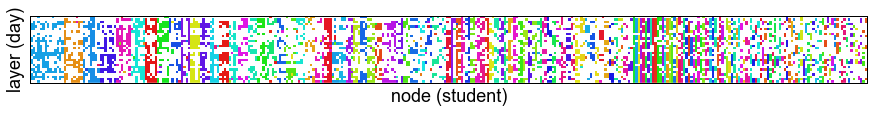

In [1236]:
## choose nodes as the 100 most active nodes
sausnodes = mostactivenodes[0:350]

# make dict of nodes:list of clustermembership with length=no. of layers present (0 if not present in layer)
sausages = { node:[] for node in sausnodes }
for nodelayer in layer_node_cluster.values():
    for node in sausnodes:
        try:
            sausages[node].append(nodelayer[node])
        except KeyError:
            sausages[node].append(0)

# make dict of nodes:most common cluster
node_clustermode = { node:Counter( filter( lambda a: a != 0, sausages[node] )).most_common(1)[0][0] 
                    for node in sausages.keys() }

# rank clusters in descending order of most commonly a "mode-cluster"
clusterrank = [cluster for cluster,rank in Counter(node_clustermode.values()).most_common() ]

# make list of appearance of sausages, bundling similar groups together
coloumnrank = []
for rankcluster in clusterrank:
    for node,modecluster in node_clustermode.iteritems():
        if modecluster == rankcluster:
            coloumnrank.append(node)
            
# use ranking to construct actual sausage matrix (and rgb color while we're at it)
def saus_color(clindex):
    saus_rgb = [(1,1,1)]+rgb_tuples
    return saus_rgb[clindex]

#saustrix = np.matrix([ map(saus_color, sausages[node] ) for node in coloumnrank ]).transpose()

saustrix = np.transpose( np.array( [ map(saus_color, sausages[node] ) for node in coloumnrank ] ), axes=[1,0,2] )
saustrix.shape

plt.figure(figsize=(15,10))
plt.imshow(saustrix, interpolation='none')
plt.xticks([]);plt.yticks([]);plt.ylabel('layer (day)');plt.xlabel('node (student)')
#plt.savefig('saustrix_intra_normed_inter_twostep_5.05muwhat.png', bbox_inches='tight')

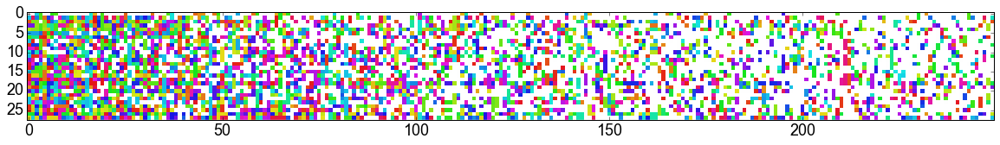

In [340]:
## choose nodes as the 100 most active nodes
sausnodes = mostactivenodes[0:250]

# init sausage matrix
nrows = len( face_feb14_daily )
ncols = len( sausnodes )
saustrix = np.ones( (nrows,ncols,3 ) )

for row in range(nrows):
    for col,node in enumerate(sausnodes):
        try:
            saustrix[row][col] = layer_node_color[row+1][node]
        except KeyError:
            pass

plt.figure(figsize=(20,15))
plt.imshow(saustrix, interpolation='none')

# new egonode

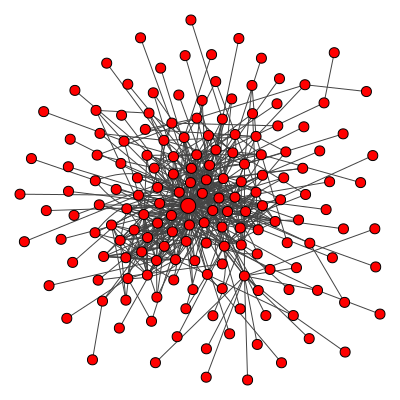

In [284]:
egonode = '8b32905dca5af2cb0f45055108a274'
#egonode = '9521d0db4ccaa684c0faddb8bcb60d'
#egonode = '91240638e0f90051f9945164715c04'

# make set of all nodes that the egonode either connected to or was in cluster with during feb14
full_ego_graph = nx.Graph()
full_ego_edgerecord = []
for layer,graph in enumerate(face_feb14_daily):
    graph = graph.to_undirected()
    layer+=1 # 1-indexed layers in dictionaries
    if egonode in graph:
        egocluster = layer_node_cluster[layer][egonode]
        cluster_nodes = layer_cluster_node[layer][egocluster]
        friends_nodes = set( graph.neighbors(egonode) )
        temp_graph = graph.subgraph( cluster_nodes | friends_nodes ) # subgraph from neighbours and clustermates
        
        full_ego_graph.add_nodes_from( temp_graph.nodes() ) # add nodes from temp graph to full_ego_graph
        full_ego_edgerecord += temp_graph.edges() # record edges (implicit weigt=1) for later counting

ego_full_edgelist = [(v1,v2,w) for (v1,v2),w in Counter(full_ego_edgerecord).iteritems()] 
ego_g = igraph.Graph.TupleList(ego_full_edgelist, directed=False, edge_attrs='weight') # igraph from counted edges
ego_g.to_undirected(mode="collapse", combine_edges=sum) # undirected for visualisation
ego_full_nodelist = ego_g.vs['name']

master_ego_layout = ego_g.layout_graphopt(node_charge=2, spring_constant=1000, niter=1000)

visual_style = {}
visual_style["bbox"] = (400,400)
visual_style["vertex_size"] = [ int(egonode==name)*5 + 10 for name in ego_g.vs['name'] ]
visual_style["layout"] = master_ego_layout
igraph.plot(ego_g, **visual_style)

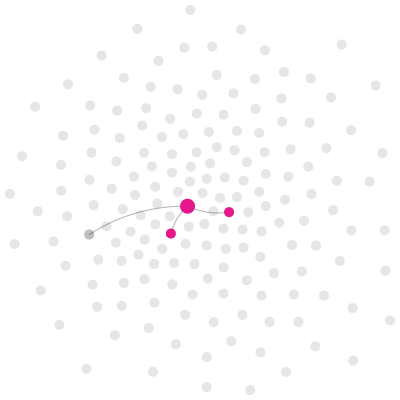

In [286]:
layer=17
nxgraph = face_feb14_daily[layer-1].to_undirected()

egocluster = layer_node_cluster[layer][egonode]
cluster_nodes = layer_cluster_node[layer][egocluster]
friends_nodes = set( nxgraph.neighbors(egonode) )
relevant_nodes = cluster_nodes | friends_nodes
#relevant_edges = [tup for tup in nxgraph.edges() if tup[0] in ego_full_nodelist and tup[1] in ego_full_nodelist]
#relevant_edges = [tup for tup in nxgraph.edges() if egonode in tup] \
#                +[tup for tup in nxgraph.edges() if tup[0] in friends_nodes and tup[1] in friends_nodes]
relevant_edges = [tup for tup in nxgraph.edges() if egonode in tup] \
                +[tup for tup in nxgraph.edges() if tup[0] in relevant_nodes and tup[1] in relevant_nodes]

geg = igraph.Graph()
geg.add_vertices(ego_full_nodelist)
geg.add_edges(relevant_edges)
geg.simplify()

colorlist=[]
for node in ego_full_nodelist:
    if node in cluster_nodes:
        colorlist.append (layer_node_color[layer][node])
        #col = layer_node_color[layer][node]
        #colorlist.append( '{},{},{}'.format(col[0],col[1],col[2]) )
    elif node in friends_nodes:
        colorlist.append( '0,0,0,0.25' )
    else:
        colorlist.append( '0,0,0,0.1' )

visual_style={}
visual_style["vertex_color"]=colorlist
visual_style["vertex_frame_color"] = '0,0,0,0'# [ '0,0,0,' + str( int(egonode==name) ) for name in geg.vs['name'] ]
visual_style["bbox"] = (400,400)
visual_style["vertex_size"] = [ int(egonode==name)*5 + 10 for name in geg.vs['name'] ]
visual_style["margin"] = 10
visual_style["edge_curved"] = .2
visual_style["edge_color"] = '0,0,0,.3'
visual_style["layout"] = master_ego_layout
igraph.plot(geg, **visual_style)


In [1342]:
def egoplot2(graphlist,egonode,layer_node_cluster,layer_cluster_node,nclus):
    
    ############################
    #### make master layout ####
    ############################
    
    # make set of all nodes that the egonode either connected to or was in cluster with during feb14
    full_ego_graph = nx.Graph()
    full_ego_edgerecord = []
    for layer,graph in enumerate(graphlist):
        graph = graph.to_undirected()
        layer+=1 # 1-indexed layers in dictionaries
        if egonode in graph:
            egocluster = layer_node_cluster[layer][egonode]
            cluster_nodes = layer_cluster_node[layer][egocluster]
            friends_nodes = set( graph.neighbors(egonode) )
            temp_graph = graph.subgraph( cluster_nodes | friends_nodes ) # subgraph from neighbours and clustermates

            full_ego_graph.add_nodes_from( temp_graph.nodes() ) # add nodes from temp graph to full_ego_graph
            full_ego_edgerecord += temp_graph.edges() # record edges (implicit weigt=1) for later counting

    ego_full_edgelist = [(v1,v2,w) for (v1,v2),w in Counter(full_ego_edgerecord).iteritems()] 
    ego_g = igraph.Graph.TupleList(ego_full_edgelist, directed=False, edge_attrs='weight') # igraph from counted edges
    ego_g.to_undirected(mode="collapse", combine_edges=sum) # undirected for visualisation
    ego_full_nodelist = ego_g.vs['name']
    master_ego_layout = ego_g.layout_graphopt(node_charge=2, spring_constant=1000, niter=1000)

    
    
    
    #########################
    #### actual plotting ####
    #########################
    
    layer_node_color,_ = la_no_clu_2_la_no_col( layer_node_cluster=layer_node_cluster, ncolors=nclus )
    
    for layer,nxgraph in enumerate(graphlist):
        layer+=1
        nxgraph = nxgraph.to_undirected()
        if egonode in nxgraph:
            egocluster = layer_node_cluster[layer][egonode]
            cluster_nodes = layer_cluster_node[layer][egocluster]
            friends_nodes = set( nxgraph.neighbors(egonode) )
            relevant_nodes = cluster_nodes | friends_nodes
            relevant_edges = [tup for tup in nxgraph.edges() if egonode in tup] \
                            +[tup for tup in nxgraph.edges() if tup[0] in relevant_nodes and tup[1] in relevant_nodes]

            geg = igraph.Graph()
            geg.add_vertices(ego_full_nodelist)
            geg.add_edges(relevant_edges)
            geg.simplify()

            colorlist=[]
            for node in ego_full_nodelist:
                if node in cluster_nodes:
                    colorlist.append (layer_node_color[layer][node])
                elif node in friends_nodes:
                    colorlist.append( '0,0,0,0.5' )
                else:
                    colorlist.append( '0,0,0,0.24' )

            visual_style={}
            visual_style["vertex_color"]=colorlist
            visual_style["vertex_frame_color"] = '0,0,0,0'# [ '0,0,0,' + str( int(egonode==name) ) for name in geg.vs['name'] ]
            visual_style["bbox"] = (200,200)
            visual_style["vertex_size"] = [ int(egonode==name)*5 + 10 for name in geg.vs['name'] ]
            visual_style["margin"] = 10
            visual_style["edge_curved"] = .2
            visual_style["edge_color"] = '0,0,0,.5'
            visual_style["layout"] = master_ego_layout
            #igraph.plot(geg, 'egoplots/%s_%s.png' %( egonode, layer),**visual_style)
            hour=layer/12
            minute=(layer%12)*5
            igraph.plot(geg, 'egoplots/%s_%s.%d.png' %( egonode, hour, minute),**visual_style)
            print '%s.%d' %( hour, minute)

In [1282]:
hour=25/12
(25%12)*5

5

In [1336]:
### facebook egoplots ###
muwhat=4.95
multiplex_network_filename = 'feb14_daily_intra_normal_inter_twostep_{}muwhat'.format(muwhat)
_,_,_,_,_,la_no_clu_face, la_clu_no_face, allcluster_node_face, infomap_results_face, nclus_face\
                                        = infomap_diagnostics(multiplex_network_filename)


egonode='9521d0db4ccaa684c0faddb8bcb60d'#'580fdf6aaa93400fde83fa68a16c72'
#egonode='8b32905dca5af2cb0f45055108a274'
egoplot2(face_feb14_daily,egonode,la_no_clu_face,la_clu_no_face,nclus_face)
#egoplot2(graphlist=face_feb14_daily, egonode=egonode)

In [1325]:
### bluetooth egoplots ###
with open('pickle_uniplex/bluetooth/mon1_5mins.pickle', 'r') as infile:
        mon1_5mins = pickle.load(infile)

timesmuwhat=2.5
multiplex_network_filename = 'mon1_5min_intra_norm_inter_2decay_{}muwhat'.format(timesmuwhat)
_,_,_,la_no_clu_blue, la_clu_no_blue, _, _, nclus_blue = infomap_bluetooth_diagnostics(multiplex_network_filename)

In [1346]:
#egonode=mostactive[0]#'8b32905dca5af2cb0f45055108a274'
egonode='9521d0db4ccaa684c0faddb8bcb60d'#'580fdf6aaa93400fde83fa68a16c72'
egoplot2(mon1_5mins,egonode,la_no_clu_blue,la_clu_no_blue,nclus_blue)

5.45
11.55
12.0
12.50
12.55
13.10
13.25
13.30
13.35
13.50
14.0
14.10
14.15
14.20
14.25
14.30
14.40
14.45
14.50
15.0
15.20
15.25
15.30
15.35
15.40
15.45
15.50
15.55
16.0
16.5
16.10
16.15
16.20
16.25
16.30
16.35
16.40
16.45
16.50
16.55


(0, 1400)

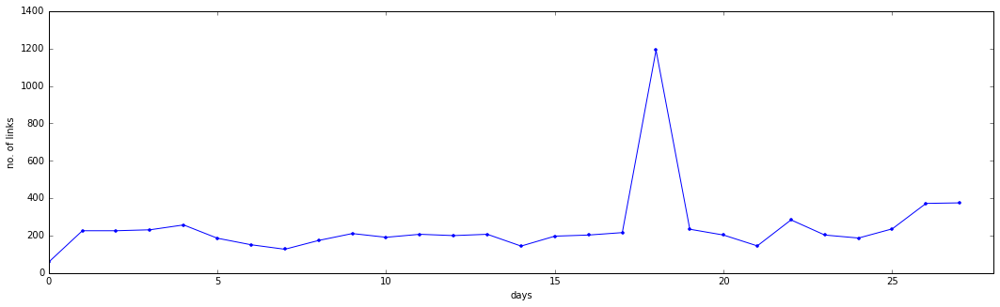

In [63]:
linkactivity=[len(g.edges()) for g in face_feb14_daily]
plt.figure(figsize=[18,5])
plt.plot(linkactivity, ls='-',marker='.')
plt.xlabel('days'); plt.ylabel('no. of links'); plt.xlim([0,28]); plt.ylim([0,1400])

In [103]:
df_bday=pd.read_csv('../Data/raw_data/facebook_birthdays.csv', sep=",")

In [152]:
import datetime
bdict = { user: 0 for user in face_feb14[0].nodes() }
for user in face_feb14[0].nodes():
    bdict[user] = df_bday[ df_bday['user'] == user ]['data'].iloc[0]
bdict = { node : datetime.datetime.strptime(bday, "%m/%d/%Y") for node,bday in bdict.iteritems() }

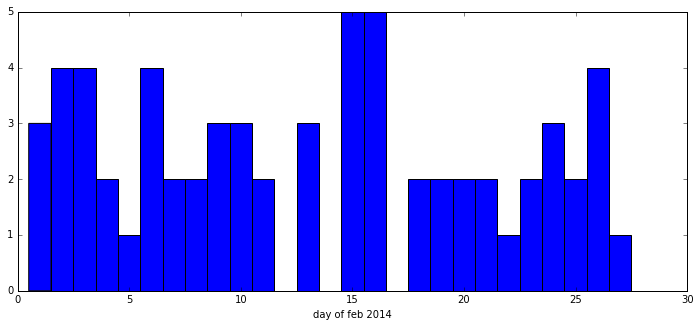

In [177]:
plt.figure(figsize=(12,5))
bdays = bdict.values()
febdays = [bday for bday in bdays if bday.month ==2]
#import matplotlib.dates as mdates
_=plt.hist( [date.day for date in febdays], bins=np.arange(0.5,28.5,1) )
plt.xlabel('day of feb 2014')

# Infomap on bluetooth data of february 2014

In [3]:
multiplex_network_filename = "mon1_5min_intra_norm_inter_2decay_2.5muwhat"
subprocess.call(['./Infomap/Infomap', 'netfiles/bluetooth/'+multiplex_network_filename+".net", 
                     'output/bluetooth', '-i', 'multiplex', '--clu', '--expanded'])

0

In [17]:
put1=subprocess.check_output(['./Infomap/Infomap', 'netfiles/bluetooth/'+multiplex_network_filename+".net", 
                     'output/bluetooth', '-i', 'multiplex',  '--clu', '--expanded',
                     '--multiplex-relax-rate 0.00001'])
put2=subprocess.check_output(['./Infomap/Infomap', 'netfiles/bluetooth/'+multiplex_network_filename+".net", 
                     'output/bluetooth', '-i', 'multiplex', '--clu', '--expanded',
                     '--multiplex-relax-rate 0.9900000001'])

In [4]:
with open('output/bluetooth/'+multiplex_network_filename+"_expanded.clu", 'r') as infile:
    multiplex_network_clusters = infile.read()
with open('int2hash/bluetooth/'+multiplex_network_filename+'.pickle', 'r') as infile:
        intid_to_hashid = pickle.load(infile)
with open('pickle_uniplex/bluetooth/feb14_4hourly.pickle', 'r') as infile:
        blue_feb14_4hourly = pickle.load(infile)

In [426]:
def infomap_bluetooth_diagnostics(multiplex_network_filename):
    # run 2-level infomap on mulitplex network 
    subprocess.call(['./Infomap/Infomap', 'netfiles/bluetooth/'+multiplex_network_filename+".net", 
                         'output/bluetooth', '-i multiplex', '--undirected', 
                         '--clu', '--expanded', '--two-level'])

    # load results of infomap, integer to hash-id dict and networkx networks
    with open('output/bluetooth/'+multiplex_network_filename+"_expanded.clu", 'r') as infile:
        multiplex_network_clusters = infile.read()
    with open('int2hash/bluetooth/'+multiplex_network_filename+'.pickle', 'r') as infile:
            intid_to_hashid = pickle.load(infile)

    # parse infomap results (extract dicts with results ordered in different ways)
    infomap_results = re.findall(r'\d+ \d+ \d+ \d\.\d+', multiplex_network_clusters)
    infomap_results = [ row.split() for row in infomap_results ]
    n_layers = max( [int(line[0]) for line in infomap_results] )
    n_clusters = max( [int(line[2]) for line in infomap_results] )

    allcluster_node = {}
    layer_cluster_node = {layer: {} for layer in range(1,n_layers+1) }
    layer_node_cluster = {layer: {} for layer in range(1,n_layers+1) }

    for layer, node, cluster, _ in infomap_results:
        try:
            allcluster_node[ int(cluster) ].add( intid_to_hashid[ int(node) ] )
        except KeyError:
            allcluster_node[ int(cluster) ] = { intid_to_hashid[ int(node) ] }

        try:
            layer_cluster_node[ int(layer) ][ int(cluster) ].add( intid_to_hashid[ int(node) ] )
        except KeyError:
            layer_cluster_node[ int(layer) ][ int(cluster) ] = { intid_to_hashid[ int(node) ] }

        layer_node_cluster[ int(layer) ][ intid_to_hashid[ int(node) ] ] = ( int(cluster) )

    AKTIV = {}
    lifetimes = []
    groupsizes = []
    for layer in layer_cluster_node.keys():
        layer_clusters = layer_cluster_node[layer].keys()
        # remove no longer active clusters
        for active_cluster in AKTIV.keys():
            if active_cluster not in layer_clusters:
                lifetimes.append( AKTIV[active_cluster] )
                del AKTIV[active_cluster]
        for cluster in layer_clusters:
            # add 1 to cluster lifetime if it is already an active cluster
            if cluster in AKTIV.keys():
                AKTIV[cluster] += 1
            # add cluster to the active ones giving it lifetime 1
            elif cluster not in AKTIV.keys():
                AKTIV[cluster] = 1
            # record groupsize of each cluster
            groupsizes.append( len(layer_cluster_node[layer][cluster]) )
    for l_time in AKTIV.values():
        lifetimes.append(l_time)

    return( np.mean(lifetimes), len(allcluster_node.keys()), np.mean(groupsizes), layer_node_cluster, layer_cluster_node, allcluster_node, infomap_results, n_clusters)

In [427]:
import timeit
tic=timeit.default_timer()
e=0.0001
muwhats=np.arange(0.02,0.1001,0.02).tolist() + np.around(np.arange(0.15,1+e,0.05),3).tolist() + np.arange(1.5,4.5+e,0.5).tolist()
results = []
for muwhat in muwhats:
    meanlife,ngroups,meansize,_,_,_,_,_ = infomap_bluetooth_diagnostics('mon1_5min_intra_norm_inter_2decay_{}muwhat'.format(muwhat) )
    results.append( [meanlife, ngroups, meansize] )
    
print timeit.default_timer() - tic

244.383333921


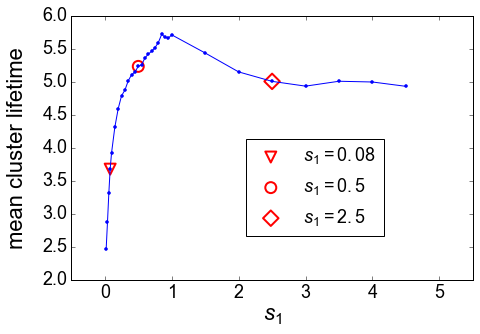

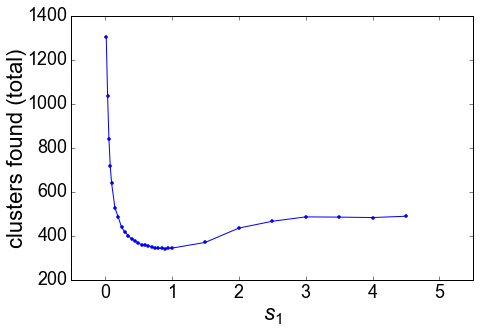

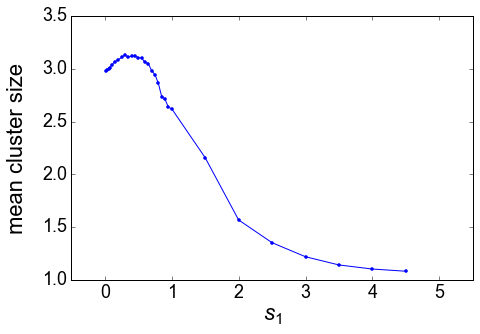

In [429]:
from matplotlib import rcParams

rcParams['font.family'] = 'Arial'#'Bitstream Vera Serif'
rcParams.update({'font.size': 18})

rcParams['mathtext.fontset'] = 'custom'
rcParams['mathtext.rm'] = 'Arial'
rcParams['mathtext.it'] = 'Arial:italic'
rcParams['mathtext.bf'] = 'Arial:bold'

ml=[meanlife for meanlife,ngroups,meansize in results]
ng=[ngroups for meanlife,ngroups,meansize in results]
ms=[meansize for meanlife,ngroups,meansize in results]
pppp=[3,12,25]

fig=plt.figure(figsize=(7,5))
ax=fig.add_subplot(111)
ax.set_xlim(-0.5,5.5)
ax.set_ylim(2,6)
ax.plot( muwhats, ml, '.-')
ax.scatter( muwhats[pppp[0]], ml[pppp[0]],marker = 'v', s=120, facecolors='none', color = 'red', lw=2, label='$s_1={}$'.format(muwhats[pppp[0]]))
ax.scatter( muwhats[pppp[1]], ml[pppp[1]],marker = 'o', s=120, facecolors='none', color = 'red', lw=2, label='$s_1={}$'.format(muwhats[pppp[1]]))
ax.scatter( muwhats[pppp[2]], ml[pppp[2]],marker = 'D', s=120, facecolors='none', color = 'red', lw=2, label='$s_1={}$'.format(muwhats[pppp[2]]))
ax.set_xlabel('$s_1$',fontsize=22)
ax.set_ylabel('mean cluster lifetime', fontsize=22)
ax.xaxis.set_label_coords(0.5,-0.1)
ax.yaxis.set_label_coords(-0.11,0.5)
ax.legend(scatterpoints=1, loc='upper right', bbox_to_anchor=(0.8, 0.57), fontsize=18)
plt.tight_layout()
#plt.savefig('figures/clustermetrics/bluetooth/LIFETIME_mon1.pdf',format="pdf", bbox_inches='tight')

fig=plt.figure(figsize=(7,5))
ax=fig.add_subplot(111)
ax.set_xlim(-0.5,5.5)
ax.plot( muwhats, ng , '.-')
ax.set_xlabel('$s_1$',fontsize=22)
ax.set_ylabel('clusters found (total)', fontsize=22)
ax.xaxis.set_label_coords(0.5,-0.1)
ax.yaxis.set_label_coords(-0.11,0.5)
plt.tight_layout()
#plt.savefig('figures/clustermetrics/bluetooth/NCLUSTERS_mon1.pdf',format="pdf", bbox_inches='tight')

fig=plt.figure(figsize=(7,5))
ax=fig.add_subplot(111)
ax.set_xlim(-0.5,5.5)
ax.plot( muwhats, ms , '.-')
ax.set_xlabel('$s_1$',fontsize=22)
ax.set_ylabel('mean cluster size', fontsize=22)
ax.xaxis.set_label_coords(0.5,-0.1)
ax.yaxis.set_label_coords(-0.11,0.5)
plt.tight_layout()
#plt.savefig('figures/clustermetrics/bluetooth/CLUSTERSIZE_mon1.pdf',format="pdf", bbox_inches='tight')

# make d3 data for bluetooth data

In [7]:
timesmuwhat=0.5
multiplex_network_filename = 'mon1_5min_intra_norm_inter_2decay_{}muwhat'.format(timesmuwhat)
_,_,_,layer_node_cluster, layer_cluster_node, allcluster_node, infomap_results, n_clusters\
                                        = infomap_bluetooth_diagnostics(multiplex_network_filename)

## ------------------------ ##
## Define LAYERS to analyse ##
## ------------------------ ##

layer_filename = '../Data/processed_data/binned_networks/bluetooth/mon1_5mins.pickle'
with open(layer_filename, 'r') as infile:
        layers = pickle.load(infile)
        
## ------------------- ##
## Compute COMMUNITIES ##
## ------------------- ##

similarities = compute_similarity_matrix(allcluster_node)

NameError: name 'infomap_bluetooth_diagnostics' is not defined

In [61]:
#Canvas parameters
actual_width = len( set([node for nodelist in allcluster_node.values() for node in nodelist]) )
actual_height = len( layer_cluster_node.items() )
min_group_size = 0

In [62]:
def is_valid_location(new_block, existing_blocks):
    """Check whether random horizontal location for block is unoccupied"""
    pad = 5
    nb_x = new_block['x']
    nb_w = new_block['w']
    nb_range = set(range(int(nb_x-pad),int(nb_x+nb_w+pad)))
    for block in existing_blocks:
        eb_x = block['x']
        eb_w = block['w']
        eb_range = set(range(int(eb_x-pad),int(eb_x+eb_w+pad)))
        if len(nb_range & eb_range) != 0:
            return False

    return True

# Set working width and height
width = actual_width*2
height = actual_height

#------#
# Time #
#------#

# Start, termination, timestep variables
t0 = str(dt.fromtimestamp(layers[0]['timestamp'].values[0])) # 2014-02-01 00:01:07
tt = str(dt.fromtimestamp(layers[-1]['timestamp'].values[-1])) # 2014-02-28 23:52:52
d_t = str((layers[1]['timestamp'].values[0]-layers[0]['timestamp'].values[0])/60) 

thickness = layers[1]['timestamp'].values[0] - \
            layers[0]['timestamp'].values[0] # 300 (seconds)

# Lines marking important points in time
grid_times = [time(h) for h in [8,12,13,17]]
grid_ticks = dict((i+1,str(dt.fromtimestamp(l['timestamp'].values[-1]))) 
                   for i, l in enumerate(layers) 
                   if dt.fromtimestamp(l['timestamp'].values[-1]).time() in grid_times)

# Time tick labels
label_times = [time(h) for h in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]]
label_ticks = dict((i+1,str(dt.fromtimestamp(l['timestamp'].values[-1]))) 
                  for i, l in enumerate(layers) 
                  if dt.fromtimestamp(l['timestamp'].values[-1]).time() in label_times) # for 24 hr bluetooth data
#label_ticks = {k:k for k in  range(1,29)} # for daily facebook data

#----------------------#
# Build data structure #
#----------------------#

# Initiate data structure
ds = {
    'meta': {'w': width, 'h': height},
    'time': {'t0': t0,
             'tt': tt,
             'dt': d_t,
             'ticks': {'label_ticks': label_ticks,
                       'grid_ticks': grid_ticks}
            },
    'sims': similarities,
    'coms': {},
    'layer_networks': {}
}

# Compute geometry and location of community blocks
preferred_locations = {}
prev_layer_blocks = {}
for l,coms in layer_cluster_node.items():
    # Community-size pairs
    com_size_pairs = [(k, len(v)) for k,v in coms.items() if len(v) >= min_group_size]
    
    # Compute blocks also in previous layer (CONTINUING BLOCKS)
    this_layer_blocks = {}
    not_in_prev = []
    for c,s in com_size_pairs:
        
        com = "c"+str(c)
        if com in prev_layer_blocks:
            prev_block = prev_layer_blocks[com]
            this_x = (prev_block['w']-s)/2.0+prev_block['x'] # center new block immediately below prev
            block = {'x':this_x, 'w': s}
            this_layer_blocks[com] = block
            
            points = [[this_x,l-1], [this_x+s,l-1], [this_x,l], [this_x+s,l]]
            for p in points:
                ds['coms'][com]['blocks'][-1]['points'].insert(
                    len(ds['coms'][com]['blocks'][-1]['points'])/2, p
                )
                
                ds['coms'][com]['tt'] = layers[l-1]['timestamp'].values[-1]
                
                ds['coms'][com]['duration'] = \
                    ds['coms'][com]['tt'] - \
                    ds['coms'][com]['t0']
                
                ds['coms'][com]['avg_size'] += s
                ds['coms'][com]['avg_size'] /= 2.0
                if s > ds['coms'][com]['max_size']: # update max size, should the current width be larger
                    ds['coms'][com]['max_size'] = s
                elif s < ds['coms'][com]['min_size']: # update min size, should the current width be smaller
                    ds['coms'][com]['min_size'] = s
        else:
            not_in_prev.append((c,s))

    # Compute blocks not in previous layer (NEW BLOCKS)
    existing_blocks = this_layer_blocks.values()
    for c, s in not_in_prev:
        com = "c"+str(c)
        
        # First try to put the block at its preferred location
        if com in preferred_locations: # community which has been "on a break" if you will
            
            this_x = preferred_locations[com]-s/2.0
            block = {'x': this_x, 'w': s}
            
            if is_valid_location(block, existing_blocks):
                
                this_layer_blocks[com] = block
                existing_blocks = this_layer_blocks.values()
                
                points = [[this_x,l-1], [this_x+s,l-1], [this_x,l], [this_x+s,l]]
                for i, p in enumerate(points):
                    if com not in ds['coms']:
                        ds['coms'][com] = {'blocks': [], 
                                           't0': layers[l-1]['timestamp'].values[0], 
                                           'tt': layers[l-1]['timestamp'].values[-1],
                                           'duration': thickness,
                                           'abs_size': len(allcluster_node[c]),
                                           'min_size': s,
                                           'max_size': s,
                                           'avg_size': s}
                    if i == 0:
                        ds['coms'][com]['blocks'].append({'points': [p], 'c': com})
                    else:
                        ds['coms'][com]['blocks'][-1]['points'].insert(
                            len(ds['coms'][com]['blocks'][-1]['points'])/2, p
                        )
                        ds['coms'][com]['avg_size'] += s
                        ds['coms'][com]['avg_size'] /= 2.0
                        if s > ds['coms'][com]['max_size']:
                            ds['coms'][com]['max_size'] = s
                        elif s < ds['coms'][com]['min_size']:
                            ds['coms'][com]['min_size'] = s
                
                # SUCCES! Continue to next community
                continue
                
        # If that fails, go ahead and place the block wherever it fits!
        counter = 0
        while True:
            counter += 1
            
            if counter > 100000:
                print "Can't place block anywhere"
                print l
                sys.exit()
                
            this_x = randrange(0,width-s)
            block = {'x':this_x, 'w': s}
            if is_valid_location(block, existing_blocks):
                this_layer_blocks[com] = block
                existing_blocks = this_layer_blocks.values()
                
                points = [[this_x,l-1], [this_x+s,l-1], [this_x,l], [this_x+s,l]]
                for i, p in enumerate(points):
                    if com not in ds['coms']:
                        ds['coms'][com] = {'blocks': [], 
                                           't0': layers[l-1]['timestamp'].values[0], 
                                           'tt': layers[l-1]['timestamp'].values[-1],
                                           'duration': thickness,
                                           'abs_size': len(allcluster_node[c]),
                                           'min_size': s,
                                           'max_size': s,
                                           'avg_size': s}
                    if i == 0:
                        ds['coms'][com]['blocks'].append({'points': [p], 'c': com})
                    else:
                        ds['coms'][com]['blocks'][-1]['points'].insert(
                            len(ds['coms'][com]['blocks'][-1]['points'])/2, p
                        )
                        ds['coms'][com]['avg_size'] += s
                        ds['coms'][com]['avg_size'] /= 2.0
                        if s > ds['coms'][com]['max_size']:
                            ds['coms'][com]['max_size'] = s
                        elif s < ds['coms'][com]['min_size']:
                            ds['coms'][com]['min_size'] = s
                break
            
        preferred_locations[com] = block['x']+block['w']/2.0
        
        
    prev_layer_blocks = this_layer_blocks
    
# Add colors
# Deprecated: is still needed on script. Misleading that it is not namechanged or something.
com_cols = {}
for com in ds['coms'].keys():
    r = np.average([mmh3.hash(n)%256 for n in allcluster_node[int(com[1:])]])
    g = np.average([mmh3.hash(n)%255 for n in allcluster_node[int(com[1:])]])
    b = np.average([mmh3.hash(n)%254 for n in allcluster_node[int(com[1:])]])

    #ds['coms'][com]['color'] = 'rgb(%d,%d,%d)' % (r,g,b)
    com_cols[com] = 'rgb(%d,%d,%d)' % (r,g,b)
    
# Add networks
def layer_networks(filename, layer_cluster_node):
    
    with open(filename, 'r') as infile:
        rawstring = infile.read()
    
    rawstring_nodes, rawstring_edges = rawstring.split("#")[:-1]
    
    nodes_map = dict((int(re.findall(r'\d+', n)[0]), re.findall(r'[0-9a-f]{30}', n)[0]) for n in 
                      re.findall(r'\d+ "Node [0-9a-f]{30}" \d\.\d', rawstring_nodes))
    nodes_map_reverse = dict((v,k) for k,v in nodes_map.items())

    ln = {'data': {}}
    
    e_li = [e_str.split() for e_str in rawstring_edges.split('\n')[1:]] # [['1', '347', '1', '348', '1'],...]

    # Add edges, one at a time
    for e in e_li:
        #layer, source, target, value = int(e[0]), int(e[1]), int(e[3]), int(e[4])
        layer, source, target, value = int(e[0]), int(e[1]), int(e[3]), float(e[4])
        try:
            group_source = [g for g,n in layer_cluster_node[layer].items() if nodes_map[source] in n][0]
            group_target = [g for g,n in layer_cluster_node[layer].items() if nodes_map[target] in n][0]
        except IndexError:
            # This occurs if the source/target has no group, WHICH IT SHOULD. Why this happend (and it
            # very rarely does) I don't know, maybe it's something with Infomap.
            print "node", source, "or", target, "has no group in layer", layer, "... skipping link!"
            continue
            
        if "c"+str(group_source) not in com_cols or "c"+str(group_target) not in com_cols:
            continue
    
        edge = {'source': source, 'target': target, 'value': value/10.0}
        try:
            ln['data'][layer]['links'].append(edge)
        except KeyError:
            ln['data'][layer] = {'links': [edge]}
        
        for n1, n2 in [(source, target),(target, source)]:
            try:
                ln['data'][layer]['links_dict'][n1].append(n2)
            except KeyError:
                try:
                    ln['data'][layer]['links_dict'][n1] = [n2]
                except KeyError:
                    ln['data'][layer]['links_dict'] = {n1: [n2]}
                
            
    # Add nodes
    for layer, edges_and_nodes in ln['data'].items():
        edges = edges_and_nodes['links']
        nodes_names = set()
        for e in edges:
            nodes_names.add(e['source'])
            nodes_names.add(e['target'])
        nodes = []
        for nn in nodes_names:
            group = [g for g,n in layer_cluster_node[layer].items()
                         if nodes_map[nn] in n][0]
            try:
                col = com_cols['c'+str(group)]
            except KeyError:
                #col = 'rgb(%d,%d,%d)' % (200,200,200)
                continue
            node = {'name': nn, 'id': nodes_map[nn], 'group': group}
            try:
                ln['data'][layer]['nodes'][nn] = node
            except KeyError:
                ln['data'][layer].update({'nodes': {nn: node}})
                
            try:
                ln['data'][layer]['groups'][group].append(node['name'])
            except KeyError:
                try:
                    ln['data'][layer]['groups'][group] = [node['name']]
                except KeyError:
                    ln['data'][layer]['groups'] = {group: [node['name']]}
    
    return ln

layer_networks = layer_networks('netfiles/bluetooth/'+multiplex_network_filename+'.net', layer_cluster_node)
ds['layer_networks'] = layer_networks

In [63]:
## -------------------------------- ##
## Store D3-loadable data structure ##
## -------------------------------- ##

with open('d3data/bluetooth_mon1_0p5.json', 'w') as outfile:
    json.dump(ds,outfile)

# saustrix for bluetooth

In [1206]:
# run infomap
muwhat=0.5
multiplex_network_filename = 'mon1_5min_intra_norm_inter_2decay_{}muwhat'.format(muwhat)
_,_,_,la_no_clu_blue, la_clu_no_blue, allcluster_node_blue, infomap_results_blue, n_clusters_blue\
                                        = infomap_bluetooth_diagnostics(multiplex_network_filename)

# make a color dictionary and use throughout
layer_node_color, rgb_tuples = la_no_clu_2_la_no_col( layer_node_cluster=layer_node_cluster, ncolors=n_clusters )

len(allcluster_node_blue.keys())

368

In [1207]:
# measure number of days each cluster was active
clusteractivation={}
allcluster_size = {cluster:len(nodes) for cluster, nodes in allcluster_node_blue.iteritems() }

for clusterlayer in la_clu_no_blue.values():
    for cluster in clusterlayer.keys():
        try:
            clusteractivation[cluster] += 1
        except KeyError:
            clusteractivation[cluster] = 1
            
mostactiveclusters = sorted(clusteractivation, key=clusteractivation.get, reverse=True )
mostmemberclusters = sorted(allcluster_size, key=allcluster_size.get, reverse=True)

# measure most active nodes
nodeactivaiton={}
for nodelayer in la_no_clu_blue.values():
    for node in nodelayer.keys():
        try:
            nodeactivaiton[node] += 1
        except KeyError:
            nodeactivaiton[node] = 1

mostactivenodes = sorted(nodeactivaiton, key=nodeactivaiton.get, reverse=True)

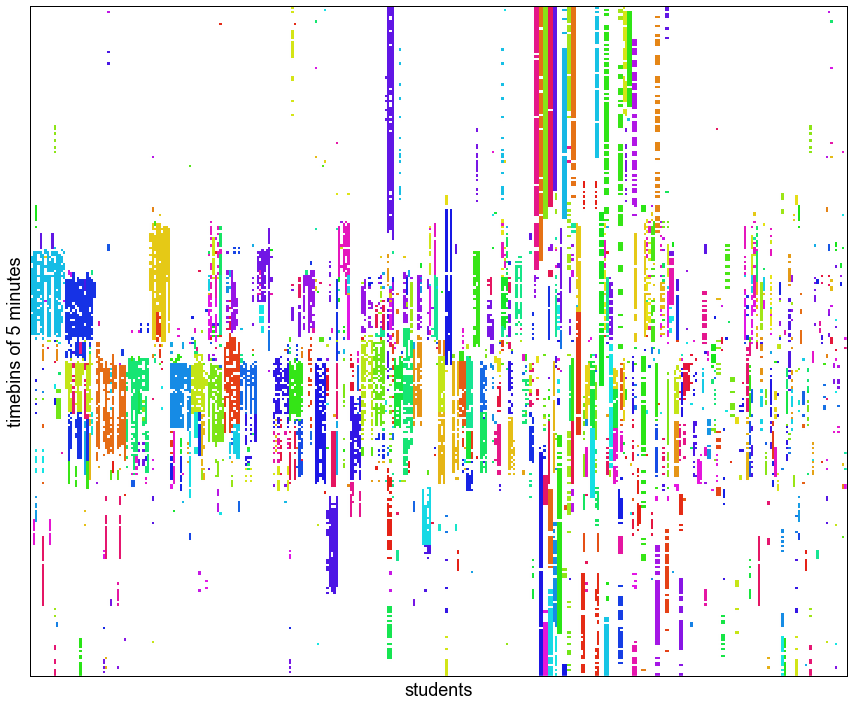

In [1209]:
## choose nodes as the 100 most active nodes
sausnodes = mostactivenodes[0:350]

# crop community history dict to timewindow we want to visualize
start = 1
stop = 288
layer_node_cluster_crop = {layer:la_no_clu_blue[layer] for layer in range(start,stop)}

# make dict of nodes:list of clustermembership with length=no. of layers present (0 if not present in layer)
sausages = { node:[] for node in sausnodes }
for nodelayer in layer_node_cluster_crop.values():
    for node in sausnodes:
        try:
            sausages[node].append(nodelayer[node])
        except KeyError:
            sausages[node].append(0)


# clean sausages of non-participating actors
for node in sausages.keys():
    c = Counter(sausages[node])
    if len(c.keys())==1 and c[0]==0:
        del sausages[node]

# make dict of nodes:most common cluster
#node_clustermode = { node:Counter( filter( lambda a: a != 0, sausages[node] )).most_common(1)[0][0] 
#                    for node in sausages.keys() }

node_clustermode = {}
for node in sausages.keys():
    mode=Counter( filter( lambda a: a != 0, sausages[node] )).most_common(1)
    if len(mode) != 0:
        node_clustermode[node] = mode[0][0]

# rank clusters in descending order of most commonly a "mode-cluster"
clusterrank = [cluster for cluster,rank in Counter(node_clustermode.values()).most_common() ]

# make left-to-right order of sausage-appearance, bundling similar groups together, starting with most active groups
coloumnrank = []
for rankcluster in clusterrank:
    for node,modecluster in node_clustermode.iteritems():
        if modecluster == rankcluster:
            coloumnrank.append(node)
            
# use ranking to construct actual sausage matrix (and rgb color while we're at it)
def saus_color(clindex):
    saus_rgb = [(1,1,1)]+rgb_tuples
    return saus_rgb[clindex]

#saustrix = np.matrix([ map(saus_color, sausages[node] ) for node in coloumnrank ]).transpose()

saustrix = np.transpose( np.array( [ map(saus_color, sausages[node] ) for node in coloumnrank ] ), axes=[1,0,2] )
saustrix.shape

fig=plt.figure(figsize=(26,12))
ax=fig.add_subplot(1,1,1)
#ax.imshow(saustrix[weekstart:weekstart+showdays*48,:], interpolation='none')
ax.imshow(saustrix, interpolation='none')
ax.set_xticks([]);ax.set_yticks([]);ax.set_ylabel('timebins of 5 minutes');ax.set_xlabel('students')


#fig.canvas.draw()
#box = ax._position.bounds

startclass=[96 for i in range(saustrix.shape[1])]
lunch=[150 for i in range(saustrix.shape[1])]
endclass=[204 for i in range(saustrix.shape[1])]

#ax.plot(startclass,color='magenta',lw=5,alpha=0.3)
#ax.plot(lunch,color='magenta',lw=20,alpha=0.3)
#ax.plot(endclass,color='magenta',lw=5,alpha=0.3)

plt.savefig('saustrix_intra_normed_inter_2decay_0.5muwhat_ex.png', bbox_inches='tight')#, format='pdf')

# infomap on entire feb14 in 5min bins

In [7]:
## ------------------------ ##
## Run infomap on netfile   ##
## ------------------------ ##

timesmuwhat=0.5
multiplex_network_filename = 'feb14_5min_intra_norm_inter_2decay_{}muwhat'.format(timesmuwhat)
life_t,n_group,group_size,layer_node_cluster, layer_cluster_node, allcluster_node, infomap_results, n_clusters\
                                        = infomap_bluetooth_diagnostics(multiplex_network_filename)

In [8]:
print(life_t, n_group, group_size, "in congruence with what is found using s1=0.5 for one day")

(5.3083757803224696, 7995, 3.001612763874089, 'in congruence with what is found using s1=0.5 for one day')


In [210]:
## ------------------------ ##
## Define LAYERS to analyse ##
## ------------------------ ##

layer_filename = '../Data/processed_data/binned_networks/bluetooth/feb14_5mins.pickle'
with open(layer_filename, 'r') as infile:
        layers = pickle.load(infile)

In [9]:
## ------------------- ##
## Compute COMMUNITIES ##
## ------------------- ##

similarities = compute_similarity_matrix(allcluster_node)

In [192]:
# cut relevant data to get a preview of how infomap behaves when running on the entire month
#layers = layers[0:3*288 +1]
#real_layer_node_cluster = copy.deepcopy(layer_node_cluster)
#real_layer_cluster_node = copy.deepcopy(layer_cluster_node)
#for l in range(len(real_layer_cluster_node)+1):
#    if l > 3*288:
#        del layer_node_cluster[l]
#        del layer_cluster_node[l]


In [193]:
#Canvas parameters
actual_width = len( set([node for nodelist in allcluster_node.values() for node in nodelist]) )
actual_height = len( layer_cluster_node.items() )
min_group_size = 0

In [204]:
def is_valid_location(new_block, existing_blocks):
    """Check whether random horizontal location for block is unoccupied"""
    pad = 5
    nb_x = new_block['x']
    nb_w = new_block['w']
    nb_range = set(range(int(nb_x-pad),int(nb_x+nb_w+pad)))
    for block in existing_blocks:
        eb_x = block['x']
        eb_w = block['w']
        eb_range = set(range(int(eb_x-pad),int(eb_x+eb_w+pad)))
        if len(nb_range & eb_range) != 0:
            return False

    return True

# Set working width and height
width = actual_width*2
height = actual_height

#------#
# Time #
#------#

# Start, termination, timestep variables
t0 = str(dt.fromtimestamp(layers[0]['timestamp'].values[0])) # 2014-02-01 00:01:07
tt = str(dt.fromtimestamp(layers[-1]['timestamp'].values[-1])) # 2014-02-28 23:52:52
d_t = str((layers[1]['timestamp'].values[0]-layers[0]['timestamp'].values[0])/60) 

thickness = layers[1]['timestamp'].values[0] - \
            layers[0]['timestamp'].values[0] # 300 (seconds)

# Lines marking important points in time
grid_times = [time(h) for h in [8,12,13,17]]
grid_ticks = dict((i+1,str(dt.fromtimestamp(l['timestamp'].values[-1]))) 
                   for i, l in enumerate(layers) 
                   if dt.fromtimestamp(l['timestamp'].values[-1]).time() in grid_times)

# Time tick labels
label_times = [time(h) for h in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]]
label_ticks = dict((i+1,str(dt.fromtimestamp(l['timestamp'].values[-1]))) 
                  for i, l in enumerate(layers) 
                  if dt.fromtimestamp(l['timestamp'].values[-1]).time() in label_times) # for 24 hr bluetooth data
#label_ticks = {k:k for k in  range(1,29)} # for daily facebook data

#----------------------#
# Build data structure #
#----------------------#

# Initiate data structure
ds = {
    'meta': {'w': width, 'h': height},
    'time': {'t0': t0,
             'tt': tt,
             'dt': d_t,
             'ticks': {'label_ticks': label_ticks,
                       'grid_ticks': grid_ticks}
            },
    'sims': similarities,
    'coms': {},
    'layer_networks': {}
}

# Compute geometry and location of community blocks
preferred_locations = {}
prev_layer_blocks = {}
for l,coms in layer_cluster_node.items():
    # Community-size pairs
    com_size_pairs = [(k, len(v)) for k,v in coms.items() if len(v) >= min_group_size]
    
    # Compute blocks also in previous layer (CONTINUING BLOCKS)
    this_layer_blocks = {}
    not_in_prev = []
    for c,s in com_size_pairs:
        
        com = "c"+str(c)
        if com in prev_layer_blocks:
            prev_block = prev_layer_blocks[com]
            this_x = (prev_block['w']-s)/2.0+prev_block['x'] # center new block immediately below prev
            block = {'x':this_x, 'w': s}
            this_layer_blocks[com] = block
            
            points = [[this_x,l-1], [this_x+s,l-1], [this_x,l], [this_x+s,l]]
            for p in points:
                ds['coms'][com]['blocks'][-1]['points'].insert(
                    len(ds['coms'][com]['blocks'][-1]['points'])/2, p
                )
                
                ds['coms'][com]['tt'] = layers[l-1]['timestamp'].values[-1]
                
                ds['coms'][com]['duration'] = \
                    ds['coms'][com]['tt'] - \
                    ds['coms'][com]['t0']
                
                ds['coms'][com]['avg_size'] += s
                ds['coms'][com]['avg_size'] /= 2.0
                if s > ds['coms'][com]['max_size']: # update max size, should the current width be larger
                    ds['coms'][com]['max_size'] = s
                elif s < ds['coms'][com]['min_size']: # update min size, should the current width be smaller
                    ds['coms'][com]['min_size'] = s
        else:
            not_in_prev.append((c,s))

    # Compute blocks not in previous layer (NEW BLOCKS)
    existing_blocks = this_layer_blocks.values()
    for c, s in not_in_prev:
        com = "c"+str(c)
        
        # First try to put the block at its preferred location
        if com in preferred_locations:
            
            this_x = preferred_locations[com]-s/2.0
            block = {'x': this_x, 'w': s}
            
            if is_valid_location(block, existing_blocks):
                
                this_layer_blocks[com] = block
                existing_blocks = this_layer_blocks.values()
                
                points = [[this_x,l-1], [this_x+s,l-1], [this_x,l], [this_x+s,l]]
                
                for i, p in enumerate(points):
                    if com not in ds['coms']:
                        ds['coms'][com] = {'blocks': [], 
                                           't0': layers[l-1]['timestamp'].values[0], 
                                           'tt': layers[l-1]['timestamp'].values[-1],
                                           'duration': thickness,
                                           'abs_size': len(allcluster_node[c]),
                                           'min_size': s,
                                           'max_size': s,
                                           'avg_size': s}
                    if i == 0:
                        ds['coms'][com]['blocks'].append({'points': [p], 'c': com})
                    else:
                        ds['coms'][com]['blocks'][-1]['points'].insert(
                            len(ds['coms'][com]['blocks'][-1]['points'])/2, p
                        )
                        ds['coms'][com]['avg_size'] += s
                        ds['coms'][com]['avg_size'] /= 2.0
                        if s > ds['coms'][com]['max_size']:
                            ds['coms'][com]['max_size'] = s
                        elif s < ds['coms'][com]['min_size']:
                            ds['coms'][com]['min_size'] = s
                
                # SUCCES! Continue to next community
                continue
                
        # If that fails, go ahead and place the block wherever it fits!
        counter = 0
        while True:
            counter += 1
            
            if counter > 100000:
                print "Can't place block anywhere"
                print l
                sys.exit()
                
            this_x = randrange(0,width-s)
            block = {'x':this_x, 'w': s}
            if is_valid_location(block, existing_blocks):
                this_layer_blocks[com] = block
                existing_blocks = this_layer_blocks.values()
                
                points = [[this_x,l-1], [this_x+s,l-1], [this_x,l], [this_x+s,l]]
                for i, p in enumerate(points):
                    if com not in ds['coms']:
                        ds['coms'][com] = {'blocks': [], 
                                           't0': layers[l-1]['timestamp'].values[0], 
                                           'tt': layers[l-1]['timestamp'].values[-1],
                                           'duration': thickness,
                                           'abs_size': len(allcluster_node[c]),
                                           'min_size': s,
                                           'max_size': s,
                                           'avg_size': s}
                    if i == 0:
                        ds['coms'][com]['blocks'].append({'points': [p], 'c': com})
                    else:
                        ds['coms'][com]['blocks'][-1]['points'].insert(
                            len(ds['coms'][com]['blocks'][-1]['points'])/2, p
                        )
                        ds['coms'][com]['avg_size'] += s
                        ds['coms'][com]['avg_size'] /= 2.0
                        if s > ds['coms'][com]['max_size']:
                            ds['coms'][com]['max_size'] = s
                        elif s < ds['coms'][com]['min_size']:
                            ds['coms'][com]['min_size'] = s
                break
            
        preferred_locations[com] = block['x']+block['w']/2.0
        
        
    prev_layer_blocks = this_layer_blocks
    
# Add colors
# Deprecated: is still needed on script. Misleading that it is not namechanged or something.
com_cols = {}
for com in ds['coms'].keys():
    r = np.average([mmh3.hash(n)%256 for n in allcluster_node[int(com[1:])]])
    g = np.average([mmh3.hash(n)%255 for n in allcluster_node[int(com[1:])]])
    b = np.average([mmh3.hash(n)%254 for n in allcluster_node[int(com[1:])]])

    #ds['coms'][com]['color'] = 'rgb(%d,%d,%d)' % (r,g,b)
    com_cols[com] = 'rgb(%d,%d,%d)' % (r,g,b)
    
# Add networks
def layer_networks(filename, layer_cluster_node):
    
    with open(filename, 'r') as infile:
        rawstring = infile.read()
    
    rawstring_nodes, rawstring_edges = rawstring.split("#")[:-1]
    
    nodes_map = dict((int(re.findall(r'\d+', n)[0]), re.findall(r'[0-9a-f]{30}', n)[0]) for n in 
                      re.findall(r'\d+ "Node [0-9a-f]{30}" \d\.\d', rawstring_nodes))
    nodes_map_reverse = dict((v,k) for k,v in nodes_map.items())

    ln = {'data': {}}
    
    e_li = [e_str.split() for e_str in rawstring_edges.split('\n')[1:]] # [['1', '347', '1', '348', '1'],...]

    # Add edges, one at a time
    for e in e_li:
        #layer, source, target, value = int(e[0]), int(e[1]), int(e[3]), int(e[4])
        layer, source, target, value = int(e[0]), int(e[1]), int(e[3]), float(e[4])
        try:
            group_source = [g for g,n in layer_cluster_node[layer].items() if nodes_map[source] in n][0]
            group_target = [g for g,n in layer_cluster_node[layer].items() if nodes_map[target] in n][0]
        except IndexError:
            # This occurs if the source/target has no group, WHICH IT SHOULD. Why this happend (and it
            # very rarely does) I don't know, maybe it's something with Infomap.
            print "node", source, "or", target, "has no group in layer", layer, "... skipping link!"
            continue
            
        if "c"+str(group_source) not in com_cols or "c"+str(group_target) not in com_cols:
            continue
    
        edge = {'source': source, 'target': target, 'value': value/10.0}
        try:
            ln['data'][layer]['links'].append(edge)
        except KeyError:
            ln['data'][layer] = {'links': [edge]}
        
        for n1, n2 in [(source, target),(target, source)]:
            try:
                ln['data'][layer]['links_dict'][n1].append(n2)
            except KeyError:
                try:
                    ln['data'][layer]['links_dict'][n1] = [n2]
                except KeyError:
                    ln['data'][layer]['links_dict'] = {n1: [n2]}
                
            
    # Add nodes
    for layer, edges_and_nodes in ln['data'].items():
        edges = edges_and_nodes['links']
        nodes_names = set()
        for e in edges:
            nodes_names.add(e['source'])
            nodes_names.add(e['target'])
        nodes = []
        for nn in nodes_names:
            group = [g for g,n in layer_cluster_node[layer].items()
                         if nodes_map[nn] in n][0]
            try:
                col = com_cols['c'+str(group)]
            except KeyError:
                #col = 'rgb(%d,%d,%d)' % (200,200,200)
                continue
            node = {'name': nn, 'id': nodes_map[nn], 'group': group}
            try:
                ln['data'][layer]['nodes'][nn] = node
            except KeyError:
                ln['data'][layer].update({'nodes': {nn: node}})
                
            try:
                ln['data'][layer]['groups'][group].append(node['name'])
            except KeyError:
                try:
                    ln['data'][layer]['groups'][group] = [node['name']]
                except KeyError:
                    ln['data'][layer]['groups'] = {group: [node['name']]}
    
    return ln

layer_networks = layer_networks('netfiles/bluetooth/'+multiplex_network_filename+'.net', layer_cluster_node)
ds['layer_networks'] = layer_networks

In [205]:
## -------------------------------- ##
## Store D3-loadable data structure ##
## -------------------------------- ##

with open('d3data/bluetooth_mon1slice_0p5.json', 'w') as outfile:
    json.dump(ds,outfile)

# build gatherings network

In [430]:
## ------------------------ ##
## Run infomap on netfile   ##
## ------------------------ ##

timesmuwhat=0.5
#multiplex_network_filename = 'mon1_5min_intra_norm_inter_2decay_{}muwhat'.format(timesmuwhat)
multiplex_network_filename = 'feb14_5min_intra_norm_inter_2decay_{}muwhat'.format(timesmuwhat)
life_t,n_group,group_size,layer_node_cluster, layer_cluster_node, allcluster_node, infomap_results, n_clusters\
                                        = infomap_bluetooth_diagnostics(multiplex_network_filename)

In [432]:
print(life_t,n_group,group_size)

(5.3166698564593302, 7988, 3.0014831027084625)


In [496]:
# compute jaccard similarity between all pairs of components of groups
similarities = compute_similarity_matrix(allcluster_node)

In [497]:
# constructing similarity matrix s.t. sim_matrix[0][22] is the similarity between group 1 and 23
def sim_dict_to_matrix(sim_dict):
    dim = len(sim_dict)
    sim_matrix = np.zeros((dim,dim))
    for i in range(dim):
        for j in range(dim):
            sim_matrix[i,j] = sim_dict['c'+str(i+1)]['c'+str(j+1)]['sim']
            
    return sim_matrix

# save the sim matrix (dict is way to large for entire feb) --- still takes about 5 min
sim_matrix = sim_dict_to_matrix(similarities)
#with open('similarity_matrices/feb14_5min_0.5muwhat.pickle', 'w') as outfile:
#            pickle.dump([layer_node_cluster,layer_cluster_node,sim_matrix], outfile)       

In [144]:
def simdict_to_net(sim_matrix,filename,cutoff=0,dyads=1):
    # takes a similarity matrix and creates a pajek .net format network of sausages as nodes and similarities as edges
    # NOTE: row/cluster i of the matrix must correspond to cluster i+1 of the community detection
    
    dim = len(sim_matrix)
    
    ################
    # add vertices #
    ################
    netfile = '*Vertices %d' % dim
    for i in range(1,dim+1):
        netfile += '\n{0} "Node c{1}"'.format(i,i)
    
    #############
    # add edges #
    #############
    netfile += '\n*arcs'
    for i in range(dim):
        for j in range(dim):
            if i>=j:
                continue
            
            if sim_matrix[i,j] > cutoff:
                if dyads:
                    netfile += '\n{0} {1} {2}'.format(i+1,j+1,sim_matrix[i,j])
                else:
                    if len(allcluster_node[i+1])> 2 and len(allcluster_node[j+1]) > 2:
                        netfile += '\n{0} {1} {2}'.format(i+1,j+1,sim_matrix[i,j])
                    
                
            
    with open("netfiles/groups/"+filename+".net", 'w') as outfile:
            outfile.write(netfile)

In [50]:
def infomap_groupnetwork_diagnostics(network_filename):
    # run 2-level infomap on mulitplex network 
    subprocess.call(['./Infomap/Infomap', 'netfiles/groups/'+network_filename+".net", 
                         'output/groups', '-i pajek', '--undirected',
                         '--clu', '--expanded', '--two-level'])

    # load results of infomap, integer to hash-id dict and networkx networks
    with open('output/groups/'+network_filename+".clu", 'r') as infile:
        network_clusters = infile.read()

    # parse infomap results (extract dicts with results ordered in different ways)
    infomap_results = re.findall(r'\d+ \d+ \d\.\d+', network_clusters)
    infomap_results = [ row.split() for row in infomap_results ]

    clu_saus = {}
    saus_clu = {}

    for saus, cluster, flow in infomap_results:
        try:
            clu_saus[ int(cluster) ].add( "c"+saus )
        except KeyError:
            clu_saus[ int(cluster) ] =  {"c"+saus}
        

        saus_clu["c"+saus] = cluster
    
    n_clusters = len(clu_saus.keys())

    return( clu_saus, saus_clu, n_clusters )

In [51]:
# Used in order to compute the Frobenius norm of a matrix
def set_to_simmatrix(clusterset):
    c_dim = len(clusterset)
    c_mat = np.zeros((c_dim,c_dim))
    for i,saus_i in enumerate(clusterset):
        for j,saus_j in enumerate(clusterset):
            c_mat[i][j] = similarities[saus_i][saus_j]['sim']
            
    return c_mat

#clu_simmat = {cluster: set_to_simmatrix(clusterset) for cluster,clusterset in clu_saus.iteritems()}

In [1157]:
### OBS ###
### This needs to be run (both w/ and w/o dyads) every time a new similarity dict and matrix are computed

## create group networks for different cutoff levels of jaccard similarity when generating the links
cutoffs=np.arange(0.05,1,0.05)
netfilename="feb14_groupnetwork_nodyads"; dyad = 0
mat=sim_matrix
for cutoff in cutoffs:
    simdict_to_net(mat,netfilename+"_cutoff{}".format(cutoff),cutoff, dyads=dyad)

In [552]:
netfilename="feb14_groupnetwork"

In [553]:

mean_size = []
sd_size = []
mean_norm = []
sd_norm = []
n_clus_list = []
for cutoff in cutoffs:
    # run infomap
    clu_saus, saus_clu, n_clus = infomap_groupnetwork_diagnostics(netfilename+"_cutoff{}".format(cutoff))
    # compute intra cluster simililarity matrices of all clusters
    clu_simmat = {cluster: set_to_simmatrix(clusterset) for cluster,clusterset in clu_saus.iteritems()}
    # compute mean norms of the sim-matrices and stds
    allnorms = [ np.linalg.norm(cluster_mat) / float(len(cluster_mat)) for cluster_mat in clu_simmat.values() ]
    mean_norm.append( np.mean(allnorms) )
    sd_norm.append( np.std( allnorms ) )
    # compute mean group size and stds
    groupsizes = [len(cluster) for cluster in clu_saus.values() ]
    mean_size.append( np.mean(groupsizes) )
    sd_size.append( np.std(groupsizes) )
    # record number of clusters
    n_clus_list.append(n_clus)
    
    print cutoff

0.05
0.1
0.15
0.2
0.25
0.3
0.35
0.4
0.45
0.5
0.55
0.6
0.65
0.7
0.75
0.8
0.85
0.9
0.95


In [184]:
## ONLY run after computing with the above W/O dyads
mean_size_nodyads = copy.deepcopy(mean_size)
sd_size_nodyads = copy.deepcopy(sd_size)
mean_norm_nodyads = copy.deepcopy(mean_norm)
sd_norm_nodyads = copy.deepcopy(sd_norm)

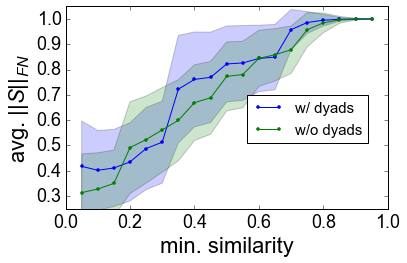

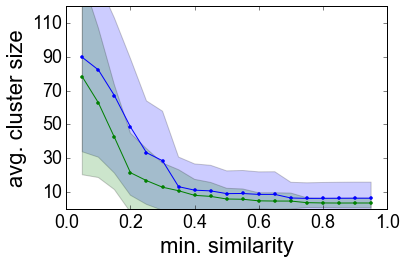

In [554]:
from matplotlib import rcParams
rcParams['font.family'] = 'Arial'#'Bitstream Vera Serif'
rcParams.update({'font.size': 18})
rcParams['mathtext.fontset'] = 'custom'
rcParams['mathtext.rm'] = 'Arial'
rcParams['mathtext.it'] = 'Arial:italic'
rcParams['mathtext.bf'] = 'Arial:bold'

fig=plt.figure(figsize=(6,4))
ax=fig.add_subplot(111)
ax.plot(cutoffs,mean_norm,'.-',label='w/ dyads')
ax.plot(cutoffs,mean_norm_nodyads,'.-',label='w/o dyads')
ax.fill_between(cutoffs, np.array(mean_norm)-np.array(sd_norm), np.array(mean_norm)+np.array(sd_norm),
                alpha=0.2, facecolor='blue')
ax.fill_between(cutoffs, np.array(mean_norm_nodyads)-np.array(sd_norm_nodyads),
                np.array(mean_norm_nodyads)+np.array(sd_norm_nodyads), alpha=0.2, facecolor='green')
ax.set_xlim(0,1)
ax.set_ylim(0.25,1.05)
ax.set_xlabel('min. similarity',fontsize=22)
ax.set_ylabel('avg. $||S||_{FN}$', fontsize=22)
ax.legend(bbox_to_anchor=(0.94, 0.56), loc='upper right', borderaxespad=0., fontsize=15)
#ax.xaxis.set_label_coords(0.5,-0.1)
#ax.yaxis.set_label_coords(-0.11,0.5)
plt.tight_layout()
#plt.savefig('figures/clustermetrics/groups/meanfrobenius_vs_cutoff_nodyads_errs.pdf',format="pdf", bbox_inches='tight')

fig=plt.figure(figsize=(6,4))
ax=fig.add_subplot(111)
ax.plot(cutoffs,mean_size,'.-')
ax.plot(cutoffs,mean_size_nodyads,'.-')
ax.fill_between(cutoffs, np.array(mean_size)-np.array(sd_size), np.array(mean_size)+np.array(sd_size),
                alpha=0.2, facecolor='blue')
ax.fill_between(cutoffs, np.array(mean_size_nodyads)-np.array(sd_size_nodyads),
                np.array(mean_size_nodyads)+np.array(sd_size_nodyads), alpha=0.2, facecolor='green')
#ax.set_xlim(0,1)
ax.set_ylim(0,120)
ax.set_xlabel('min. similarity',fontsize=22)
ax.set_ylabel('avg. cluster size', fontsize=22)
ax.set_yticks([10,30,50,70,90,110])
#ax.plot(cutoffs,[6 for c in cutoffs],color='red')
plt.tight_layout()
#plt.savefig('figures/clustermetrics/groups/meansize_vs_cutoff_nodyads_errs.pdf',format="pdf", bbox_inches='tight')

In [555]:
sd_norm

[0.17906084513891324,
 0.15750150981788996,
 0.15258129989461197,
 0.15449432031036089,
 0.16260792645013789,
 0.161897979821434,
 0.21258869924362422,
 0.18754772960888699,
 0.1787735340997105,
 0.15005246285404142,
 0.14799713734715295,
 0.13141499325150965,
 0.12908039366756477,
 0.079608144886349971,
 0.043392351913305226,
 0.022834702255397837,
 0.0075763966753873034,
 0.0016406458276491036,
 0.0]

# cool 1-day vis

In [1183]:
# infomap on some nice day
cutoff = 0.95
#netfilename="1daytest_groupnetwork"
netfilename="feb14_groupnetwork_nodyads"
dyads=0
clu_saus, saus_clu, n_clus = infomap_groupnetwork_diagnostics(netfilename+"_cutoff{}".format(cutoff))

dim = len(sim_matrix)
active_saus_int = [ int(re.findall(r'\d+', saus )[0]) for saus in saus_clu.keys() ]

print n_clus

edgelist=[]
for i in active_saus_int:
    for j in active_saus_int:
        if i>=j:
            pass
        else:
            if sim_matrix[i-1,j-1] > cutoff:# and 'c'+str(i+1) in active_saus and 'c'+str(j+1) in active_saus:
                if dyads:
                    edgelist.append(('c'+str(i),'c'+str(j),sim_matrix[i-1,j-1]))
                else:
                    if len(allcluster_node[i])> 2 and len(allcluster_node[j]) > 2:
                        edgelist.append(('c'+str(i),'c'+str(j),sim_matrix[i-1,j-1]))
print len(edgelist)
print len(active_saus_int)

159
1276
536


In [1176]:
# visualisation of community detection on the groupnet

HSV_tuples = [(x*1.0/n_clusters, 0.9, 0.9) for x in range(n_clusters)]
RGB_tuples = map(lambda x: colorsys.hsv_to_rgb(*x), HSV_tuples)
RGB_tuples = sample(RGB_tuples, n_clusters)


g = igraph.Graph.TupleList(edgelist, directed=False, edge_attrs="weight")

N=len(g.vs)
visual_style={}
visual_style["bbox"] = (500,500)
outdegree = g.outdegree()
clustersizes = [ len( allcluster_node[int(re.findall(r'[0-9]+', cluster)[0]) ] ) for cluster in g.vs['name'] ]
visual_style["vertex_size"] = [3 + 1.5*np.sqrt(gs) for gs in clustersizes]#[3 + 100*np.sqrt(gs)/max(clustersizes) for gs in clustersizes]
visual_style["margin"] = 10
visual_style["layout"] = g.layout_fruchterman_reingold(maxiter=1000,repulserad=(N**3)/10,weights=[w for n1,n2,w in edgelist]) #layout
#visual_style["layout"] = g.layout_graphopt(niter=500, node_charge=0.1, node_mass=30, spring_length=0, spring_constant=20) #layout
visual_style["vertex_color"] = [RGB_tuples[int(saus_clu[name])-1] for name in g.vs['name'] ]
#visual_style["edge_arrow_size"] = 1.101

igraph.plot(g,'figures/new_groupnet_nodyads_cutoff{}.pdf'.format(cutoff),  **visual_style)

# histograms for similarities and groupsizes

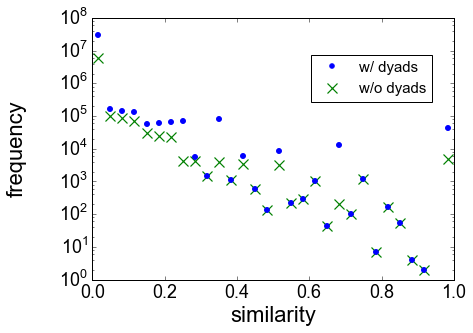

In [558]:
fig=plt.figure(figsize=(7,5))
ax=fig.add_subplot(111)
y1,binEdges1=np.histogram(all_sims,bins=30)
y2,binEdges2=np.histogram(all_sims_nodyads,bins=30)
bincenters1 = 0.5*(binEdges1[1:]+binEdges1[:-1])
bincenters2 = 0.5*(binEdges2[1:]+binEdges2[:-1])
ax.plot(bincenters1,y1,'.',ms=10, label="w/ dyads",color="blue")
ax.plot(bincenters2,y2,'x',ms=10, mew=1.2, label="w/o dyads",color='green')
ax.plot(bincenters1,y1,'.',ms=10,color="blue")
ax.set_yscale('log')
ax.set_xlabel('similarity',fontsize=22)
ax.set_ylabel('frequency', fontsize=22)
ax.xaxis.set_label_coords(0.5,-0.1)
ax.yaxis.set_label_coords(-0.18,0.5)
plt.tight_layout()
ax.legend(bbox_to_anchor=(0.94, 0.86), loc='upper right', borderaxespad=0., fontsize=15, numpoints=1)
plt.savefig('figures/clustermetrics/groups/similarity_distribution.pdf',format='pdf')

### note the large discrepancies are at 2/3 and some at smaller ratios corresponding to dyads partaking in bigger gatherings

In [559]:
binEdges2

array([ 0.        ,  0.03333333,  0.06666667,  0.1       ,  0.13333333,
        0.16666667,  0.2       ,  0.23333333,  0.26666667,  0.3       ,
        0.33333333,  0.36666667,  0.4       ,  0.43333333,  0.46666667,
        0.5       ,  0.53333333,  0.56666667,  0.6       ,  0.63333333,
        0.66666667,  0.7       ,  0.73333333,  0.76666667,  0.8       ,
        0.83333333,  0.86666667,  0.9       ,  0.93333333,  0.96666667,  1.        ])

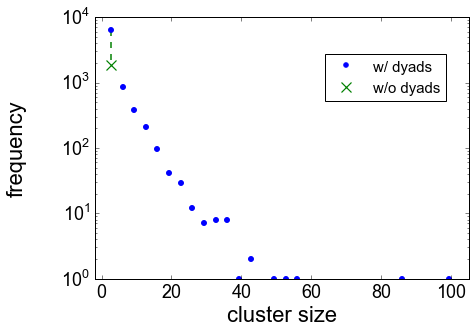

In [560]:
fig=plt.figure(figsize=(7,5))
ax=fig.add_subplot(111)
y1,binEdges1=np.histogram(sizes,bins=30)
y2,binEdges2=np.histogram(sizes_nodyads,bins=binEdges1)
bincenters1 = 0.5*(binEdges1[1:]+binEdges1[:-1])
bincenters2 = 0.5*(binEdges2[1:]+binEdges2[:-1])
ax.plot(bincenters1,y1,'.',ms=10,color='blue',label='w/ dyads')
ax.plot([bincenters2[0],bincenters2[0]],[y1[0],y2[0]],color="green",lw=1.5,ls='--')
ax.plot(bincenters2[0],y2[0],'x',mew=1.2,ms=10,label='w/o dyads',color='green')
ax.plot(bincenters1,y1,'.',ms=10,color='blue')
ax.set_yscale('log')
ax.set_xlabel('cluster size',fontsize=22)
ax.set_ylabel('frequency', fontsize=22)
ax.set_xlim(-2,105)
ax.set_ylim(-100,10**4)
ax.xaxis.set_label_coords(0.5,-0.1)
ax.yaxis.set_label_coords(-0.18,0.5)
ax.legend(bbox_to_anchor=(0.94, 0.86), loc='upper right', borderaxespad=0., fontsize=15, numpoints=1)
plt.tight_layout()
plt.savefig('figures/clustermetrics/groups/groupsize_distribution.pdf',format='pdf')

# participation profiles

In [1184]:
# infomap on some nice day
cutoff = 0.8
#netfilename="1daytest_groupnetwork"
netfilename="feb14_groupnetwork_nodyads"
dyads=0
clu_saus, saus_clu, n_clus = infomap_groupnetwork_diagnostics(netfilename+"_cutoff{}".format(cutoff))
dim = len(sim_matrix)

maxsize = max([ len(sauset) for clu,sauset in clu_saus.iteritems() ])
maxclu = [clu for clu,sauset in clu_saus.iteritems() if len(sauset)==maxsize ][0]
maxclu

1

In [1185]:
def partiprofiler1(uberclu):
    """ Return count object of ubercluster participation profile,
    using participation in each individual cluster.
    Relies on definition of allcluster_node dict from infomapping all february"""
    partilist = []
    for c in clu_saus[uberclu]:
        [partilist.append(person) for person in allcluster_node[ int(re.findall(r'\d+', c )[0]) ] ]
    
    # sort
    count=Counter(partilist)
    return count


# cluster to layer mapping
clu_lay = {}
for lay,clusters in layer_cluster_node.iteritems():
    for clu in clusters.keys():
        try:
            clu_lay[clu].append(lay)
        except KeyError:
            clu_lay[clu] = [lay]

appearances=[len(ap) for ap in clu_lay.values()]
np.mean(appearances)


def partiprofiler2(uberclu):
    """ Return count object of ubercluster participation profile,
    using participation in each time slice of each individual cluster.
    Relies on definition of cluster to active-layer mapping """
    partilist = []
    for c in clu_saus[uberclu]:
        c_int = int(re.findall(r'\d+', c )[0])
        # layers in which cluster c is active
        layer_activity = clu_lay[c_int]
        for layer in layer_activity:
            [partilist.append(person) for person in layer_cluster_node[layer][c_int] ]
            
    count=Counter(partilist)
    return count

def runif_pp_maxgap(size, maxparticipation):
    """ Simulate a participation profile of given size and maximal participation
    from uniform distribution and return the maximum gap """
    pp=np.random.randint(low=1,high=maxparticipation,size=size)
    pp=sorted(pp,reverse=True)
    maxdiff=max( -np.diff(pp) )
    
    return maxdiff

In [1186]:
def core_extract(uberclu):
    count = partiprofiler2(uberclu)
    pp = sorted( count.values(), reverse=True )
    maxdiff = max( -np.diff(pp) )
    coresize = list(-np.diff(pp)).index(maxdiff) + 1
    
    # generate random gaps to see if real gap is significant
    N=100
    rangaps=[runif_pp_maxgap(size=len(pp),maxparticipation=max(pp)) for i in range(100)]
    randiff = np.mean(rangaps) + np.std(rangaps)
    
    if maxdiff > randiff:
        return [tag for tag,participation in count.most_common()[:coresize]]
    else:
        return []

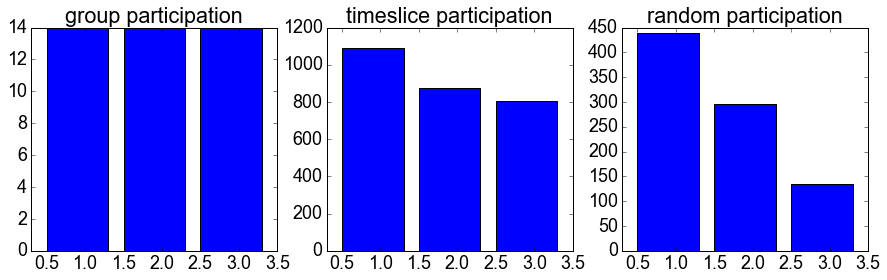

In [1195]:
# which ubercluster to plot
uberclu = 5

count1 = partiprofiler1(uberclu)
partiprof1 = sorted( list( count1.itervalues() ), reverse=True )

count2 = partiprofiler2(uberclu)
partiprof2 = sorted( list( count2.itervalues() ), reverse=True )

# plot
fig = plt.figure(figsize=(15,4))

ax = fig.add_subplot(131)
ax.set_xlim(0.3,len(partiprof1)+0.5)
ax.bar(np.arange(0.5,len(partiprof1)+0.5,1),partiprof1)
ax.set_title('group participation')

ax = fig.add_subplot(132)
ax.set_xlim(0.3,len(partiprof2)+0.5)
ax.bar(np.arange(0.5,len(partiprof2)+0.5,1),partiprof2)
ax.set_title('timeslice participation')


ax = fig.add_subplot(133)

pp=np.random.randint(low=1,high=max(partiprof2),size=len(partiprof2))
pp=sorted(pp,reverse=True)
ax.set_xlim(0.3,len(pp)+0.5)
ax.bar(np.arange(0.5,len(pp)+0.5,1),pp)
ax.set_title('random participation')

#plt.savefig('party_profile_{}.pdf'.format(uberclu),format='pdf')

In [1010]:

count = partiprofiler2(101)
pp = sorted( count.values(), reverse=True )
maxdiff = max( -np.diff(pp) )
coresize = list(-np.diff(pp)).index(maxdiff) + 1


N=1000
rangaps=[runif_pp_maxgap(size=len(pp),maxparticipation=max(pp)) for i in range(100)]
randiff = np.mean(rangaps) + np.std(rangaps)

print randiff, maxdiff

11.7138269162 14


## facebook activity of cores

In [1017]:
all_cores=[core_extract(x+1) for x in range( len(clu_saus.keys()) )]
core_sizes = [len(core) for core in all_cores]
all_bffs = {hashid for core in all_cores for hashid in core}

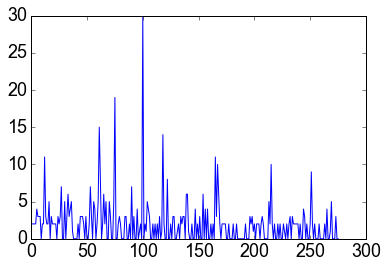

In [1019]:
plt.plot(core_sizes)

In [1020]:
lim=5
len([x for x in core_sizes if x<lim])/float(len(core_sizes))

0.8876811594202898

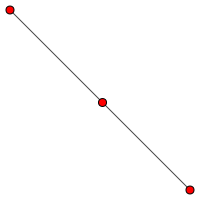

In [568]:
h = igraph.Graph()

firstrow = sim_matrix[0,:]
c1edges = [(0,i) for i in range(dim) if firstrow[i]>0]
h.add_vertices(['a','b','c'])
h.add_edges([('a','b'),('c','b')])

visual_style={}
visual_style["bbox"] = (200,200)
outdegree = h.outdegree()
visual_style["vertex_size"] = 8 #[ int(egonode==name)*5 + 10 for name in gg.vs['name'] ]##[x/max(outdegree)*10+5 for x in outdegree]
visual_style["margin"] = 10
visual_style["layout"] = h.layout_graphopt(niter=500, node_charge=0.1, node_mass=30, spring_length=0, spring_constant=20) #layout
visual_style["vertex_color"] = 'red'#[layer_node_color[day][name]+(0.5+0.5*int(name==egonode),) for name in gg.vs['name'] ]
#visual_style["edge_arrow_size"] = 1.101
igraph.plot(h,**visual_style)

# muwhat

In [569]:
layer_filename = 'pickle_uniplex/bluetooth/mon1_5mins.pickle'
with open(layer_filename, 'r') as infile:
        mon5min = pickle.load(infile)

In [570]:
G_midday=blue5min[144]
np.mean( G_midday.degree().values() )

NameError: name 'blue5min' is not defined

In [ ]:
degs=[]
for g in mon5min:
    degs.append( np.mean( g.degree().values() ) )
plt.plot(degs)

In [ ]:
np.mean(degs)

In [ ]:
all_sims=[]
all_sims_nodyads=[]

for i in range(dim):
    for j in range(dim):
        if i >= j:
            all_sims.append(sim_matrix[i][j])
            if len(allcluster_node[i+1]) > 2 and len(allcluster_node[j+1]) > 2:
                all_sims_nodyads.append(sim_matrix[i][j])
                
sizes = [len(c) for c in allcluster_node.values()]
sizes_nodyads = [len(c) for c in allcluster_node.values() if len(c)>2]
            

# bjarke business

In [ ]:
def term(N,k):
    q=0.3
    rho=0.4
    return math.factorial(N)/float( (math.factorial(k)*math.factorial(N-k))) * ( (q**k)*((1-q)**(N-k))*(1-((1-rho)**k))+(-rho*q)**k )

N=10
zum=0
for k in range(1,N+1):
    print term(N,k)
    zum+=term(N,k)
    
print 'the sum is ',zum